# **SEGMENTATION OF Cerebral Microhemorrhage V2**

### First Step: Detect slices with microbleed

**Dataset** - available in the directory: '/notebooks/datasets/TGO/CAA_MRI_T2star'. 
 
**Achitecture** - U-Net

**Loss Function** - Dice Loss

**Optimizer** - Adam
<!--
**Metrics** - Mean dice (compute mean dice)-->

In [1]:
#imports
import os
import glob
import math
import shutil
from livelossplot import PlotLosses
#import pickle
import datetime
import time

import pandas as pd
import numpy as np
#import numpy.ma as ma
from sklearn.model_selection import train_test_split
from sklearn.utils   import shuffle
from sklearn.metrics import accuracy_score, ConfusionMatrixDisplay, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
import nibabel as nib
#torch
import torch
import torch.nn as nn
from   torch.nn import CrossEntropyLoss
from   torch.optim import SGD, Adam
import torch.optim as optim

#from model import ResNet
#from torchsummary import summary
from torchinfo import summary
#monai
from monai.networks.nets import UNet, DenseNet, AttentionUnet
from monai.utils import set_determinism, first
#from monai.networks.layers import Norm
from monai.networks.layers.factories import Conv, Norm, Pool
from monai.networks.utils import one_hot, predict_segmentation
from monai.config import print_config
from monai.data import Dataset, DataLoader, NibabelReader, decollate_batch
from monai.inferers import sliding_window_inference
from monai.losses import DiceLoss
from monai.metrics import get_confusion_matrix, compute_confusion_matrix_metric, ConfusionMatrixMetric, DiceMetric, compute_meandice#, compute_generalized_dice
from monai.optimizers import Novograd
from monai.transforms import (
    #import necessary transforms
    Activations,
    AddChanneld,
    AsDiscrete,
    AsDiscreted,
    Compose,
    EnsureType,
    LabelFilterd,
    LoadImaged,
    MapTransform,
    Orientationd,
    RandAffined,
    RandFlipd,
    RandRotated,
    Resized,
    ScaleIntensityRanged,
    ScaleIntensityd,
    SpatialPadd,
    ToTensord
)

In [2]:
#constants
#debuging
DEBUG = False

#device
#DEVICE = torch.device("cpu") #use cpu
DEVICE = torch.device("cuda:0") #use GPU 

#Determinism
RSEED = 12345678
set_determinism(seed = RSEED) #enable deterministic training globally for python, numpy and pytorh in one line

#Dataset and Dataloader
LABEL_ID = 1  #microbleeds
NUM_WORKERS = 0
BATCH_SIZE = 10
SHUFFLE = True

#training
LOAD_BEST_CHECKPOINT = False#True
LEARNING_RATE = 1e-4
WEIGHT_DECAY = 1e-5
MOMENTUM = 0.95
VAL_INTERVAL = 1  # do validation for every epoch
NUM_CLASSES = 2
TRAIN_EPOCH = 500
DROPOUT = 0.2
AUGMENTATION_PROB = 0.3
#Mean dice
INCLUDE_BACKGROUND = False

#date
now = datetime.datetime.now()
date_str = now.strftime("%Y_%m_%d")
hour_str = now.strftime("%Hh_%Mm")
DATE_STR = f"Data{date_str}_Hora{hour_str}" #to create a new checkpoint

#label to check
LABEL = {
    "micro":1,
    "macro":2
}
CHOSEN_LABEL = "micro"

#Paths
DATASETS_DIR = "/notebooks/datasets/TGO" #datasets path
DATA_DIR = f"{DATASETS_DIR}/CAA_MRI_T2star" #path to the dataset
NUMPY_DIR = f"{DATASETS_DIR}/CAA_MRI_T2star_numpy"
RESULTS_PATH_CLASS = "./Results/Results_Classification" #path to save the model's results
RESULTS_PATH_SEGMENT = "./Results/Results_segmentation" #path to save the model's results
TRIAL_NAME = f"Results_{TRAIN_EPOCH}epoch_{DATE_STR}" #name of the atempt (to create a folder in the path set above)

CHECKPOINT_PATH_CLASS = f"{RESULTS_PATH_CLASS}/{TRIAL_NAME}"
CHECKPOINT_PATH_SEGMENT = f"{RESULTS_PATH_SEGMENT}/{TRIAL_NAME}"

NUMPY_FILE = f'{NUMPY_DIR}/np_{CHOSEN_LABEL}.npz' #numpy file name for both scans and masks

if(DEBUG):
    print_config()

In [3]:
def create_Folder(FolderName):
    try:
        os.makedirs(FolderName) #recursivo
        print(f"Successfully created the directory {FolderName}")
    except OSError:
        print(f"The folder {FolderName} already exist")
        
def test_next_slice(image, index, label):
    try:
        if(image[:, :, index].max() == label):
            if(image[:, :, index + 1].max() != label):
                return True
    except:
        return False
    return False

def test_previous_slice(image, index, label):
    try:
        if(image[:, :, index].max() == label):
            if(image[:, :, index - 1].max() != label):
                return True
    except:
        return False
    return False

In [4]:
def nii_to_np(save = False):
    scans_files = glob.glob(f"{DATA_DIR}/*/*/[!mask]*.nii.gz")
    masks_files = glob.glob(f"{DATA_DIR}/*/*/mask.nii.gz")
    output_scans = []
    output_masks = []
    total_scans = 0
    used_scans = 0
    discarted_scans  = 0
    discarted_slices = 0
    for i in range(len(scans_files)):
        scan = scans_files[i]
        mask = masks_files[i]
        read_scan = NibabelReader().read(scan).get_fdata()
        read_mask = NibabelReader().read(mask).get_fdata()
        read_mask = np.where(read_mask != LABEL[CHOSEN_LABEL], 0, read_mask) #select only the correct label
        total_scans += 1
        read_scan /= read_scan.max() #normalize intensity
        if(read_mask.max() == LABEL[CHOSEN_LABEL]): #microbleed in exam
            used_scans += 1
            for slice_index in range(read_scan.shape[2]):
                read_scan_slice = read_scan[:, :, slice_index]
                read_mask_slice = read_mask[:, :, slice_index]
                if(read_mask_slice.max() == LABEL[CHOSEN_LABEL]): #microbleed in slice
                    output_scans.append(read_scan_slice)
                    output_masks.append(read_mask_slice)
                    if test_next_slice(read_scan, slice_index, LABEL[CHOSEN_LABEL]):
                        #add next slice if the current has but next does not
                        output_scans.append(read_scan[:, :, slice_index + 1])
                        output_masks.append(read_mask[:, :, slice_index + 1])
                    if test_previous_slice(read_scan, slice_index, LABEL[CHOSEN_LABEL]):
                        #add previous slice if the current has but previous does not
                        output_scans.append(read_scan[:, :, slice_index - 1])
                        output_masks.append(read_mask[:, :, slice_index - 1])
                else:
                    discarted_slices += 1
        else: #does not have the selected label
            #add 1/3 of the non label images
            start_slice = read_scan.shape[2] // 3 #1/3
            for slice_index in range(start_slice, 2 * start_slice):
                    output_scans.append(read_scan[:, :, slice_index])
                    output_masks.append(read_mask[:, :, slice_index])
    output_scans = np.array(output_scans)
    output_masks = np.array(output_masks)
    output_scans, output_masks = shuffle(output_scans, output_masks, random_state = RSEED) #shuffle both
    print(f"Scan_list: {output_scans.shape}")
    print(f"Using {used_scans}/{total_scans}exams")
    print(f"Discarted {discarted_slices}")
    if(save):
        if(not os.path.exists(NUMPY_DIR)):
            create_Folder(NUMPY_DIR)
        #save the np files, using compressed format
        print("Started saving")
        np.savez_compressed(NUMPY_FILE, scans = output_scans, masks = output_masks) #save images
        print(f"Saved file {NUMPY_FILE}")
        #np.savez_compressed(MASKS_NP_FILE, output_masks) #save corresponding labels
        #print(f"Saved file {MASKS_NP_FILE}")
        print("Done")

if(not os.path.exists(NUMPY_FILE)):
    print(f"File {NUMPY_FILE} not found, creating...")
    nii_to_np(save = True) #save to true if files need to be saved
else:
    print(f"File {NUMPY_FILE} found, continuing!")

File /notebooks/datasets/TGO/CAA_MRI_T2star_numpy/np_micro.npz found, continuing!


### CHECK AND VISUALIZE DATA 

In [5]:
def new_set(scans_list, masks_list):
    label_with =    1
    label_without = 0
    return [
        {"scan": scan, "mask" : mask, "label": label_with if mask.max() != 0 else label_without}
        for scan, mask in zip(scans_list, masks_list)
    ]

def load_numpy():
    #load numpy arrays
    exams = np.load(NUMPY_FILE, allow_pickle = True)
    scans_files = exams["scans"]
    masks_files = exams["masks"]
  
    train_scans, val_scans, train_masks, val_masks = train_test_split(scans_files, masks_files, test_size = 0.2, random_state = RSEED)

    train_set = [ entry for entry in new_set(train_scans, train_masks) if entry["label"] == 1]
    val_set =   [ entry for entry in new_set(val_scans, val_masks) if entry["label"] == 1]
    
    
    print("="*20)
    print(f"Total de imagens:   {scans_files.shape}")
    print(f"Casos de treino:    {train_scans.shape}")
    print(f"Casos de validação: {val_scans.shape}")
    print("="*20)

    return train_set, val_set

#função para colocar o label por extenso
def output_label(label, mapping = 'label'):
    if (mapping == 'ext'):
        output_mapping = { 0 : "No Hemorrhage", 1 : "With Micro Hemorrhage", 2 : "With Macro Hemorrhage"  }
    elif (mapping == 'ext2'):
        output_mapping = { "0" : "No Hemorrhage", "1" : "With Micro Hemorrhage", "2" : "With Macro Hemorrhage" }
    else:
        output_mapping = { 0 : "No Hemorrhage", 1 : "With Micro Hemorrhage", 2 : "With Macro Hemorrhage" }
    label_input = (label.item() if type(label) == torch.Tensor else label) #pode ser um tensor
    return output_mapping[label_input]

train_set, val_set = load_numpy()

Total de imagens:   (454,)
Casos de treino:    (363,)
Casos de validação: (91,)


-----------------------------------casos_treino-----------------------------------
casos: 205
['With Micro Hemorrhage']
['1']
[205]
205


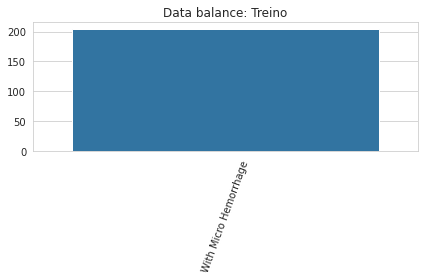

-----------------------------------casos_validação-----------------------------------
casos: 54
['With Micro Hemorrhage']
['1']
[54]
54


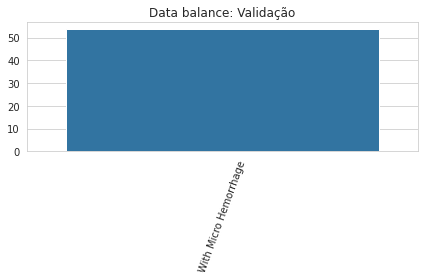

In [6]:
#verificar o balanceamento dos dados
def visualize_holdout_balance(labels, class_names, titulo):                          
    with sns.axes_style('whitegrid'):#sns.set_style('whitegrid'):
        print("casos:",len(labels))
        x, y = np.unique(labels, return_counts = True)
        x_ext = [class_names(n)  for n in x]#[n] em vez de (n)
        print(x_ext)
        print([str(n) for n in x])
        print(y)
        print(np.sum(y))
        grafico = sns.barplot(x_ext, y)
        grafico.set_title(f'Data balance: {titulo}')
        plt.xticks(rotation = 70)
        plt.tight_layout()
        #plt.savefig('data_balance_MLP.png')
        plt.show()
        
print("-----------------------------------casos_treino-----------------------------------")   
visualize_holdout_balance([train_case["label"] for train_case in train_set], output_label, 'Treino')
print("-----------------------------------casos_validação-----------------------------------")   
visualize_holdout_balance([val_case["label"] for val_case in val_set], output_label, 'Validação')

In [7]:
def transforms():
    train_transform = Compose(
        [
            AddChanneld(keys = ["scan", "mask"]),
            Resized(keys = ["scan", "mask"], spatial_size = (256, 256), mode = ('bilinear'), align_corners = True),
            ScaleIntensityd(keys = ["scan", "mask"], minv = 0, maxv = 1),
            #augmentation 
            RandFlipd(keys = ["scan", "mask"], spatial_axis = 0, prob = AUGMENTATION_PROB),
            RandRotated(keys = ["scan", "mask"], range_x = 10 * (math.pi/180), prob = AUGMENTATION_PROB), #rotação em radianos
            #RandAffined(keys = ["scan"], prob = AUGMENTATION_PROB),
            ToTensord(keys = ["scan", "mask", "label"]),
        ]
    )
    val_transform = Compose(
        [
            AddChanneld(keys = ["scan", "mask"]),
            Resized(keys = ["scan", "mask"], spatial_size = (256, 256), mode = ('bilinear'), align_corners = True),
            ScaleIntensityd(keys = ["scan", "mask"], minv = 0, maxv = 1),
            ToTensord(keys = ["scan", "mask", "label"]),
        ]
    )
    return train_transform, val_transform

train_transform, val_transform = transforms() #initialize transforms

def dataloader(train_files, train_transform, val_transform, val_files):
    train_ds = Dataset(data = train_files, transform = train_transform)
    train_loader = DataLoader(train_ds, batch_size = BATCH_SIZE, shuffle = SHUFFLE, num_workers = NUM_WORKERS)
    train_loader_all = DataLoader(train_ds, batch_size = len(train_ds), shuffle = SHUFFLE, num_workers = NUM_WORKERS)
    val_ds = Dataset(data = val_files, transform = val_transform)
    val_loader = DataLoader(val_ds, batch_size = BATCH_SIZE, num_workers = NUM_WORKERS)
    val_loader_all = DataLoader(val_ds, batch_size = len(val_ds), num_workers = NUM_WORKERS)

    return train_loader, val_loader, train_loader_all, val_loader_all #initialize dataloader

train_loader, val_loader, train_loader_all, val_loader_all = dataloader(train_set, train_transform, val_transform, val_set) #initialize dataloader

Train
Image shape: torch.Size([10, 1, 256, 256]), Mask shape: torch.Size([10, 1, 256, 256]), Label shape: torch.Size([10])


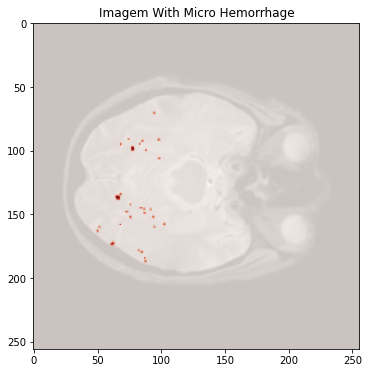

Validation
Image shape: torch.Size([10, 1, 256, 256]), Mask shape: torch.Size([10, 1, 256, 256]), Label shape: torch.Size([10])


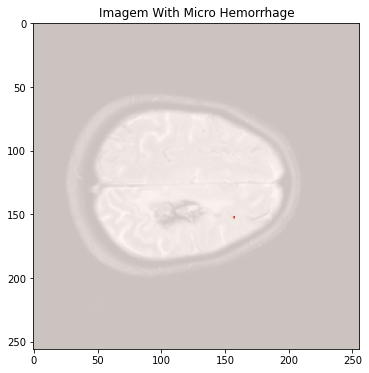

In [8]:
def check_transforms(loader):
    check_data = first(loader)
    image, mask, label = (check_data["scan"], check_data["mask"], check_data["label"])
    print(f"Image shape: {image.shape}, Mask shape: {mask.shape}, Label shape: {label.shape}")
    image, mask, label = image[0][0], mask[0][0], label[0]
    plt.figure("Check", (6, 6))
    plt.title(f"Imagem {output_label(label)}")
    plt.imshow(image, cmap = "gray")
    plt.imshow(np.where(mask != 0, mask, 0), cmap = 'Reds', alpha = 0.8)#'jet'
    plt.show()

print(f"{10 * '='}\nTrain\n{10 * '='}")
check_transforms(train_loader)
print(f"{10 * '='}\nValidation\n{10 * '='}")
check_transforms(val_loader)

### Define the model

In [9]:
def get_model(lr_rate, weight_decay, momentum):
    model = UNet(
        dimensions = 2,
        in_channels = 1,
        out_channels = NUM_CLASSES,
        channels = (16, 32, 64, 128, 256),
        strides = (2, 2, 2, 2),
        num_res_units = 2,
        norm = Norm.BATCH,
        dropout = DROPOUT,
    ).to(DEVICE)

    loss_function = DiceLoss(to_onehot_y = True, softmax = True)
    optimizer = Adam(model.parameters(), lr_rate)
    
    #scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        #optimizer, factor=0.1, patience=5, verbose=True)
    return model, loss_function, optimizer

def get_model_segmentation(lr_rate, weight_decay, momentum):
    model = AttentionUnet(
        spatial_dims = 2, #dimensions
        in_channels = 1,
        out_channels = NUM_CLASSES,
        channels = (16, 32, 64, 128, 256),
        strides = (2, 2, 2, 2),
        #num_res_units = 2,
        #norm = Norm.BATCH,
        dropout = DROPOUT,
    ).to(DEVICE)

    loss_function = DiceLoss(to_onehot_y = True, softmax = True) #MaskedDiceLoss
    optimizer = Adam(model.parameters(), lr_rate)
    
    return model, loss_function, optimizer

model, loss_function, optimizer = get_model_segmentation(LEARNING_RATE, WEIGHT_DECAY, MOMENTUM) #scheduler, scaler
print(summary(model, (BATCH_SIZE, 1, 256, 256), verbose = 0))

Layer (type:depth-idx)                                                                Output Shape              Param #
AttentionUnet                                                                         --                        --
├─Sequential: 1-1                                                                     [10, 2, 256, 256]         --
│    └─ConvBlock: 2-1                                                                 [10, 16, 256, 256]        --
│    │    └─Sequential: 3-1                                                           [10, 16, 256, 256]        2,544
│    └─AttentionLayer: 2-2                                                            [10, 16, 256, 256]        --
│    │    └─Sequential: 3-2                                                           [10, 32, 128, 128]        1,975,260
│    │    └─UpConv: 3-3                                                               [10, 16, 256, 256]        4,656
│    │    └─AttentionBlock: 3-4                               

In [10]:
def test_folder(path):
    if(not os.path.exists(path)):#if the folder doesn't exist create it
        try:
            os.makedirs(path)#recursivo
            print(f"Successfully created the directory {path}")
        except OSError:
            print(f"The folder {path} already exist")
        
def get_best_checkpoint(model_name = ""):
    '''
    Returns the most recent best checkpoint to start the training
    '''
    if(model_name == "segmentation"):
        best_checkpoint_list = glob.glob(f"{RESULTS_PATH_SEGMENT}/*/BestCheckpoint/*.pt")
    elif(model_name == "classification"):
        best_checkpoint_list = glob.glob(f"{RESULTS_PATH_CLASS}/*/BestCheckpoint/*.pt")
    else:
        return ""
    the_best = ["", 0]
    for checkpoints in best_checkpoint_list:
        if(os.path.getctime(checkpoints) > the_best[1]):
            the_best[1] = os.path.getctime(checkpoints)
            the_best[0] = checkpoints
    return the_best[0]

def load_ckp(checkpoint_fpath, model, optimizer):
    """
    checkpoint_path: path to save checkpoint
    model: model that we want to load checkpoint parameters into       
    optimizer: optimizer we defined in previous training
    """
    # load check point
    checkpoint = torch.load(checkpoint_fpath)
    # initialize state_dict from checkpoint to model
    model.load_state_dict(checkpoint['state_dict'])
    # initialize optimizer from checkpoint to optimizer
    optimizer.load_state_dict(checkpoint['optimizer'])
    # Loads the schedulers state
    #scheduler.load_state_dict(checkpoint['scheduler'])
    print ('=> Loading checkpoint')
    return model, optimizer, checkpoint

def save_ckp(state, is_best, checkpoint_path):
    """
    state: checkpoint we want to save
    is_best: is this the best checkpoint; min validation loss
    checkpoint_path: path to save checkpoint
    best_model: path to save best model
    """
    test_folder(checkpoint_path)#if the folder doesn't exist create it
    test_folder(f"{checkpoint_path}/BestCheckpoint")#if the folder doesn't exist create it
    # save checkpoint data to the path given, checkpoint_path
    torch.save(state, f"{checkpoint_path}/Checkpoint.pt")
    # if it is a best model, min validation loss
    if is_best:
        # copy that checkpoint file to best path given, best_model
        shutil.copyfile(f"{checkpoint_path}/Checkpoint.pt", f"{checkpoint_path}/BestCheckpoint/BestCheckpoint.pt")
        print ('=> Saving best checkpoint')

In [11]:
def train_model(model, loss_function, optimizer, n_epochs):
    liveloss = PlotLosses()
    best_metric = -1
    best_metric_epoch = -1
    starttime = time.perf_counter()
    
    if(LOAD_BEST_CHECKPOINT):
        # create checkpoint variable and add important data
        try:
            model, optimizer, checkpoint = load_ckp(get_best_checkpoint(), model, optimizer)
            start_epochs = checkpoint['epoch']
            n_epochs += start_epochs
        except Exception as e:
            print("Could not load checkpoint, continuing!")
    else:
        start_epochs = 0
    #initialize var
    func_output = {"model" : model}
    
    for epoch in range(start_epochs, n_epochs + 1):
        logs = {}
        print("=" * 10)
        print(f"epoch {epoch}/{n_epochs}")
        print("=" * 10)
                                      ##########################################
# ************************************************* TRAINING THE MODEL ************************************************* #
                                      ##########################################
        model.train()
        running_loss  = 0.0
        running_corrects  = 0.0
        
        for batch_data in train_loader:
            inputs = batch_data["scan"].to(DEVICE)
            masks = batch_data["mask"].to(DEVICE)
            outputs = model(inputs) #predict
            loss = loss_function(outputs, masks)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            running_loss += loss.detach() * inputs.size(0)
            masks = one_hot(masks, num_classes = NUM_CLASSES)
            running_corrects = compute_meandice(y_pred = outputs, y = masks, include_background = INCLUDE_BACKGROUND)#compute_meandice
            #replace nan by 0
            running_corrects = torch.nan_to_num(running_corrects)
        #Loss
        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_acc = 1 - epoch_loss #torch.mean(running_corrects, dtype = float)#running_corrects.float() / len(train_loader.dataset)
        logs['loss'] = epoch_loss.item()
        logs['accuracy'] = epoch_acc.item() 
                                      ##########################################
# ************************************************* VALIDATE THE MODEL ************************************************* #
                                      ##########################################
        model.eval()
        with torch.no_grad():
            running_loss  = 0.0
            running_corrects  = 0.0
            for val_data in val_loader:
                val_inputs = val_data["scan"].to(DEVICE)
                val_masks = val_data["mask"].to(DEVICE)
                val_outputs = model(val_inputs)
                loss = loss_function(val_outputs, val_masks)
                running_loss += loss.detach() * val_inputs.size(0)
                val_masks = one_hot(val_masks, num_classes = NUM_CLASSES)
                running_corrects = compute_meandice(y_pred = val_outputs, y = val_masks, include_background = INCLUDE_BACKGROUND)#compute_meandice
                #replace nan by 0
                running_corrects = torch.nan_to_num(running_corrects)
            epoch_loss = running_loss / len(val_loader.dataset)
            epoch_acc = 1 - epoch_loss #torch.mean(running_corrects, dtype = float)#running_corrects.float() / len(val_loader.dataset)
            logs['val_loss'] = epoch_loss.item()
            logs['val_accuracy'] = epoch_acc.item()
            # update checkpoint variable
            checkpoint = {'epoch': epoch, 'state_dict': model.state_dict(), 'optimizer': optimizer.state_dict()}
            if epoch_acc > best_metric:
                best_metric = epoch_acc
                best_metric_epoch = epoch
                save_ckp(checkpoint, True, CHECKPOINT_PATH_SEGMENT)
                func_output["model"] = model
                print('Saved new best metric model')
        save_ckp(checkpoint, False, CHECKPOINT_PATH_SEGMENT) # save checkpoint
        #liveplots
        liveloss.update(logs)
        liveloss.send()
    #To return
    func_output["epoch"] = epoch
    func_output["logs"] = logs
    
    endtime = time.perf_counter()
    print(f"Train completed, best_metric: {best_metric:.4f} at epoch: {best_metric_epoch}")   
    print(f"Model trained with {TRAIN_EPOCH} epochs and {DROPOUT * 100}% dropout")
    print(f"Time spent: {endtime - starttime} seconds")
    
    return func_output

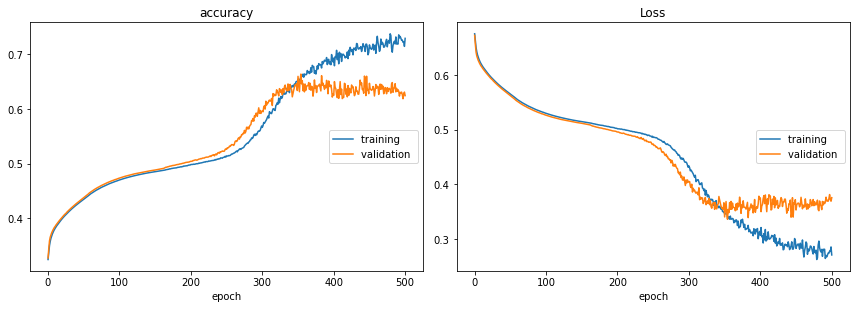

accuracy
	training         	 (min:    0.324, max:    0.738, cur:    0.729)
	validation       	 (min:    0.327, max:    0.664, cur:    0.624)
Loss
	training         	 (min:    0.262, max:    0.676, cur:    0.271)
	validation       	 (min:    0.336, max:    0.673, cur:    0.376)
Train completed, best_metric: 0.6640 at epoch: 354
Model trained with 500 epochs and 20.0% dropout
Time spent: 2777.732360944152 seconds


In [12]:
#20%dropout 500 epoc
trained_model_output = train_model(model, loss_function, optimizer, TRAIN_EPOCH)

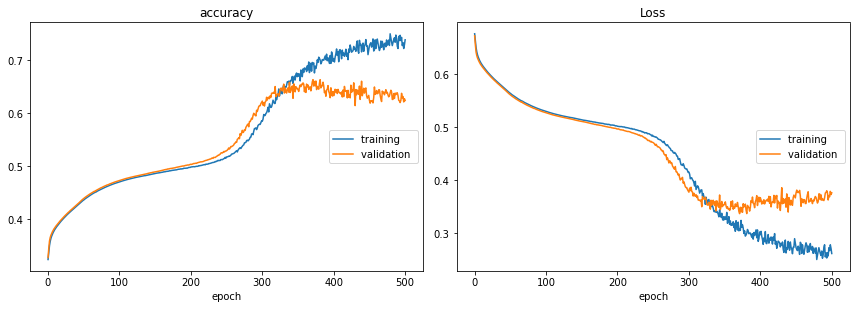

accuracy
	training         	 (min:    0.324, max:    0.750, cur:    0.739)
	validation       	 (min:    0.328, max:    0.664, cur:    0.624)
Loss
	training         	 (min:    0.250, max:    0.676, cur:    0.261)
	validation       	 (min:    0.336, max:    0.672, cur:    0.376)
Train completed, best_metric: 0.6637 at epoch: 371
Model trained with 500 epochs and 15.0% dropout
Time spent: 2934.1435287557542 seconds


In [12]:
#15%dropout 500 epoc
trained_model_output = train_model(model, loss_function, optimizer, TRAIN_EPOCH)

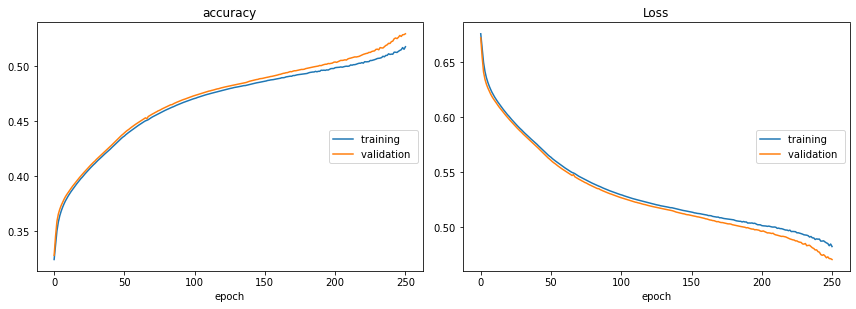

accuracy
	training         	 (min:    0.324, max:    0.518, cur:    0.518)
	validation       	 (min:    0.328, max:    0.530, cur:    0.530)
Loss
	training         	 (min:    0.482, max:    0.676, cur:    0.482)
	validation       	 (min:    0.470, max:    0.672, cur:    0.470)
Train completed, best_metric: 0.5297 at epoch: 250
Model trained with 250 epochs and 15.0% dropout
Time spent: 1474.2075514532626 seconds


In [12]:
#15%dropout 250 epoc
trained_model_output = train_model(model, loss_function, optimizer, TRAIN_EPOCH)

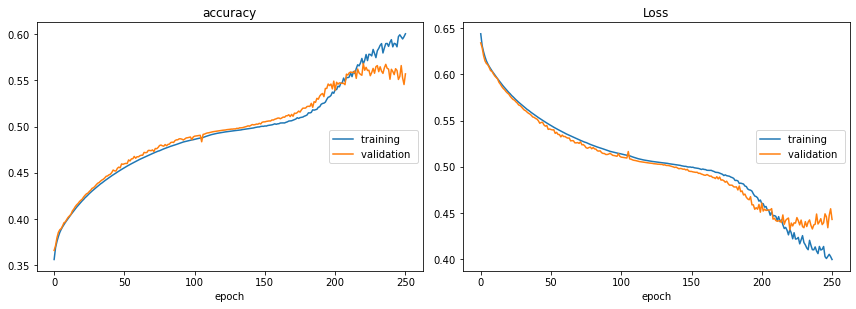

accuracy
	training         	 (min:    0.356, max:    0.600, cur:    0.600)
	validation       	 (min:    0.366, max:    0.568, cur:    0.557)
Loss
	training         	 (min:    0.400, max:    0.644, cur:    0.400)
	validation       	 (min:    0.432, max:    0.634, cur:    0.443)
Train completed, best_metric: 0.5682 at epoch: 220
Time spent: 816.391026686877 seconds


In [12]:
#15%dropout 250 epoc
trained_model_output = train_model(model, loss_function, optimizer, TRAIN_EPOCH)

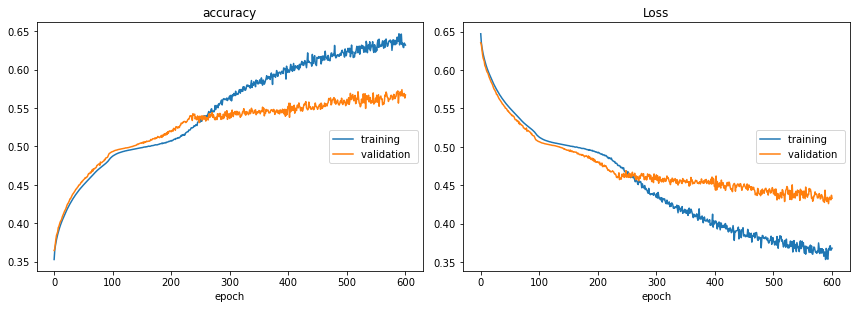

accuracy
	training         	 (min:    0.353, max:    0.647, cur:    0.632)
	validation       	 (min:    0.365, max:    0.574, cur:    0.567)
Loss
	training         	 (min:    0.353, max:    0.647, cur:    0.368)
	validation       	 (min:    0.426, max:    0.635, cur:    0.433)
Train completed, best_metric: 0.5739 at epoch: 594
Time spent: 1895.0747543275356 seconds


In [12]:
#30%dropout 600 epoc
trained_model_output = train_model(model, loss_function, optimizer, TRAIN_EPOCH)

# Evaluate and Test Model

=> Loading checkpoint


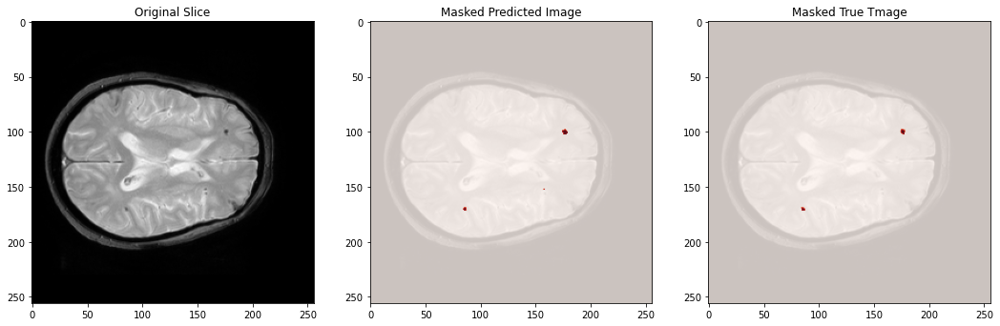

In [22]:
# fazer uma previsão utilizando um caso
def make_prediction(model, img, mask, label):
    img = img.to(DEVICE)
    img = img[None, :]
    mask = mask[None, :]
    prediction = model(img).cpu().detach().numpy()
    img = img.cpu()
    prediction = np.where(prediction > 0.5, 1, 0)
    plt.figure("Check", (3*6, 6))
    plt.axis('off')
    plt.grid(b = None)
    plt.subplot(1, 3, 1)
    plt.title(f"Original Slice")
    plt.imshow(img[0,0], cmap = plt.get_cmap('gray'))
    plt.subplot(1, 3, 2)
    plt.title("Masked Predicted Image")
    plt.imshow(img[0,0], cmap = plt.get_cmap('gray'))
    plt.imshow(prediction[0,1], cmap = 'Reds', alpha = 0.8)
    plt.subplot(1, 3, 3)
    plt.title("Masked True Tmage")
    plt.imshow(img[0,0], cmap = plt.get_cmap('gray'))
    plt.imshow(mask[0,0], cmap = 'Reds', alpha = 0.8)
    plt.show()

model, _, _ = load_ckp(get_best_checkpoint("segmentation"), model, optimizer)
check_data = next(iter(val_loader_all))
image, mask, label = (check_data["scan"], check_data["mask"], check_data["label"])
make_prediction(model, image[3], mask[3], label[3])

=> Loading checkpoint
slice  0
dice loss:  0.577687680721283
dice score:  0.42231231927871704


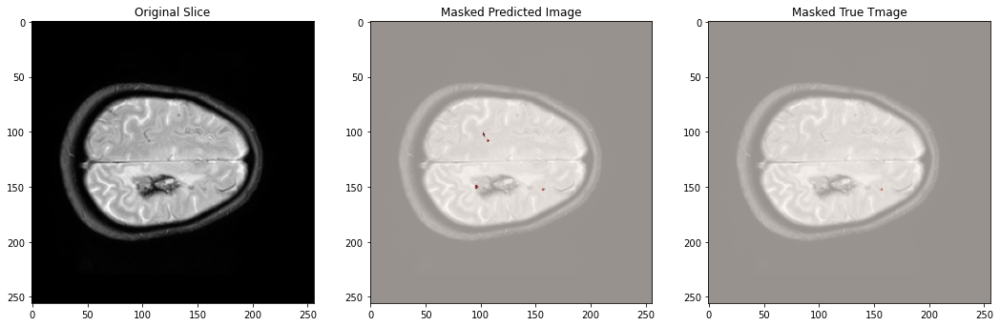

slice  1
dice loss:  0.5750591158866882
dice score:  0.42494088411331177


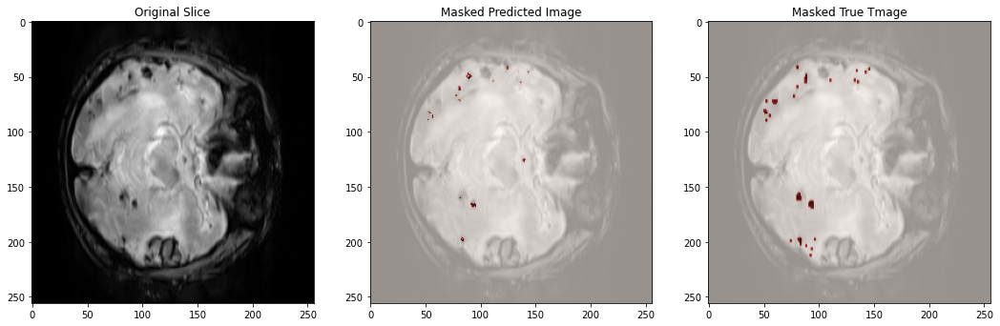

slice  2
dice loss:  0.5771863460540771
dice score:  0.42281365394592285


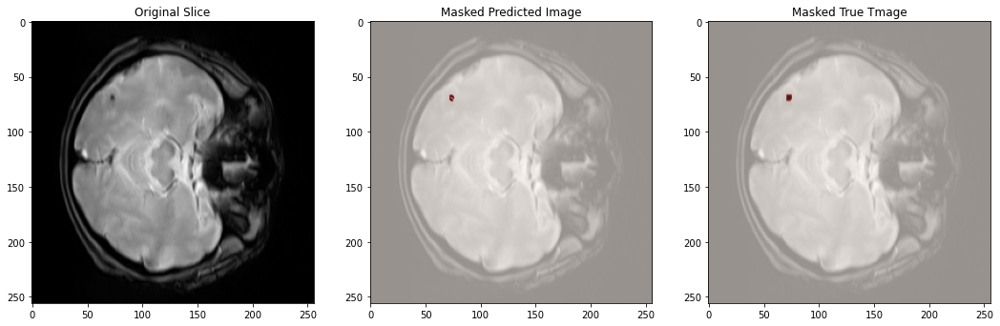

slice  3
dice loss:  0.5773234963417053
dice score:  0.4226765036582947


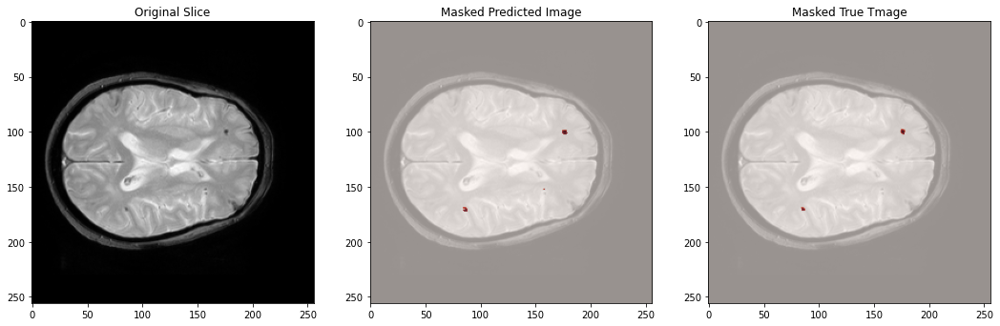

slice  4
dice loss:  0.5774908661842346
dice score:  0.4225091338157654


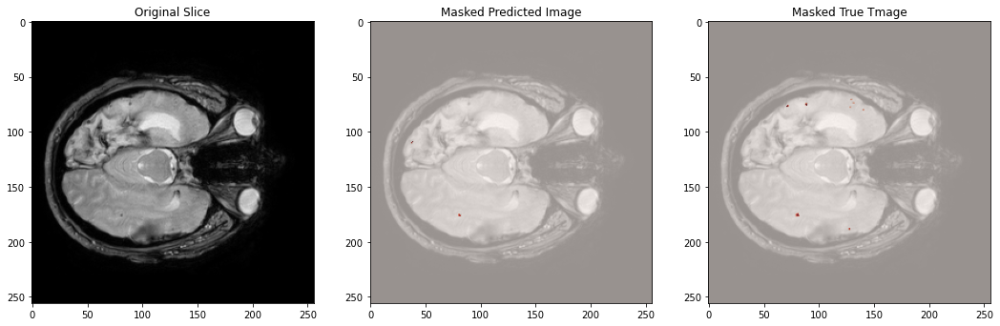

slice  5
dice loss:  0.5757443904876709
dice score:  0.4242556095123291


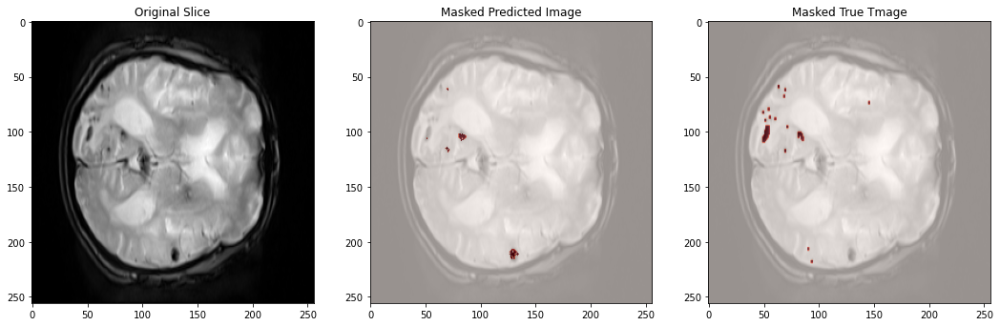

slice  6
dice loss:  0.5768675804138184
dice score:  0.42313241958618164


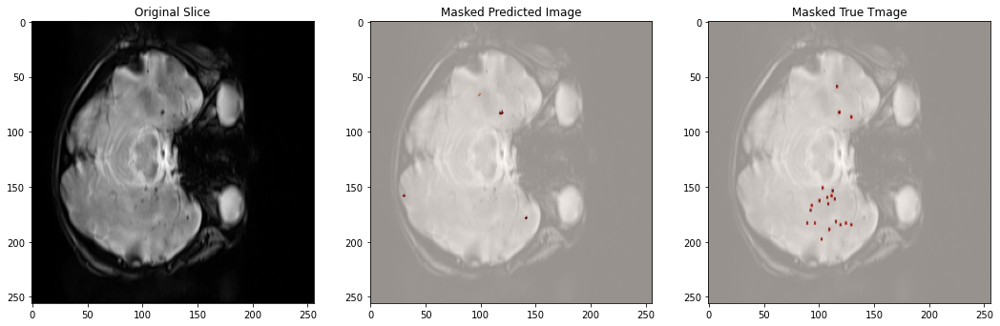

slice  7
dice loss:  0.5776993036270142
dice score:  0.42230069637298584


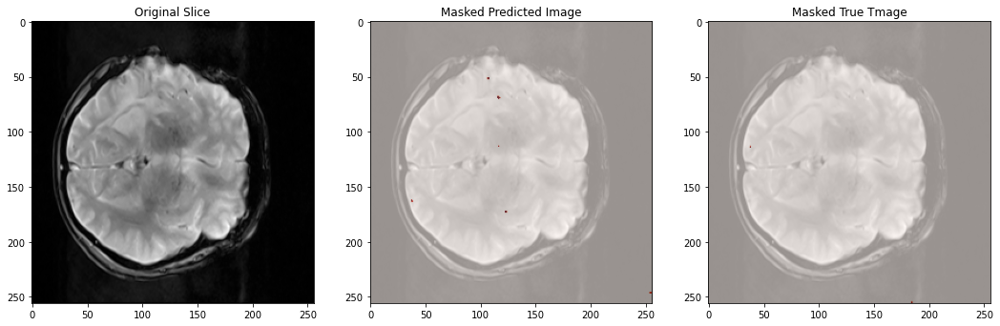

slice  8
dice loss:  0.5775920152664185
dice score:  0.42240798473358154


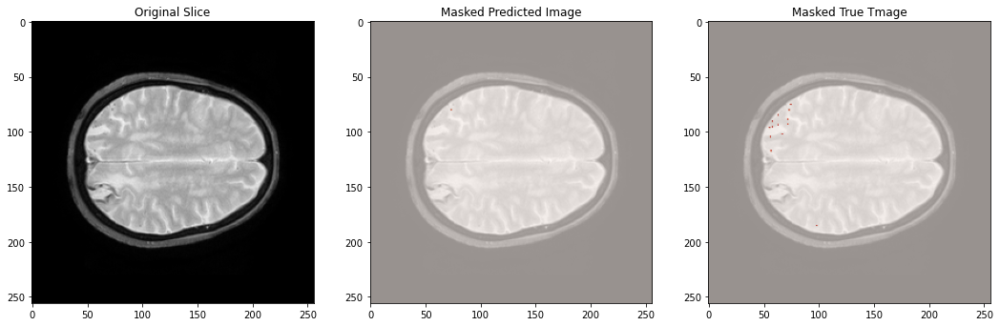

slice  9
dice loss:  0.5759128332138062
dice score:  0.42408716678619385


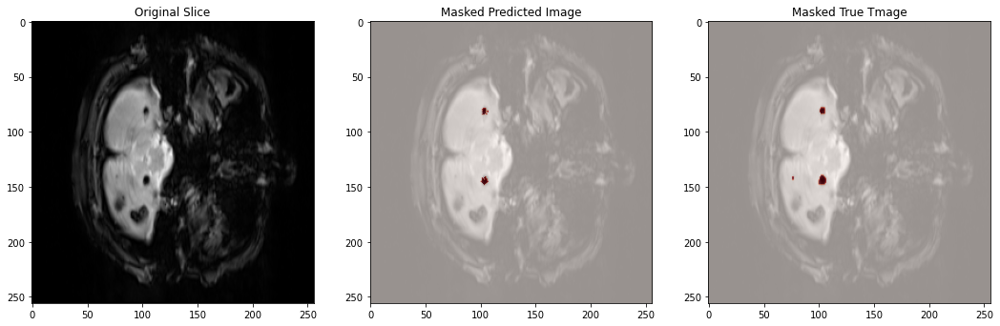

slice  10
dice loss:  0.5776256322860718
dice score:  0.4223743677139282


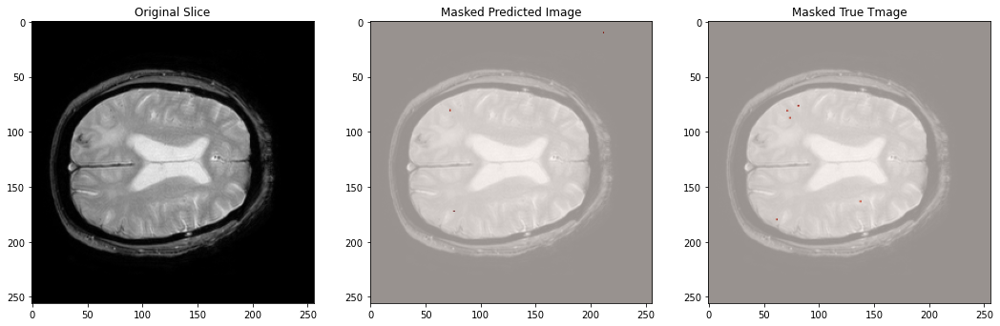

slice  11
dice loss:  0.5771232843399048
dice score:  0.4228767156600952


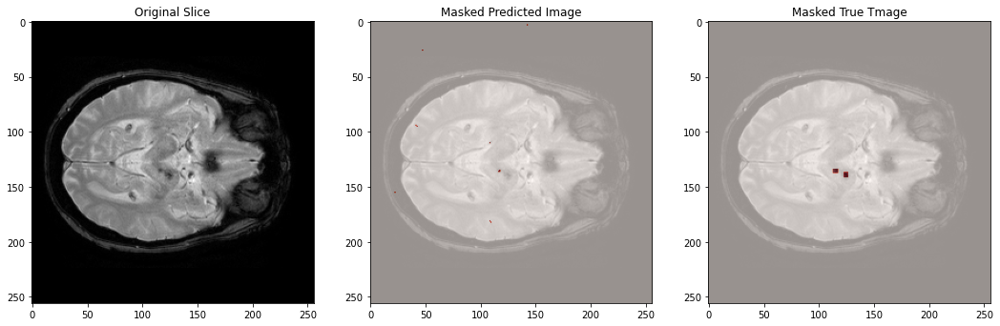

slice  12
dice loss:  0.5771111845970154
dice score:  0.4228888154029846


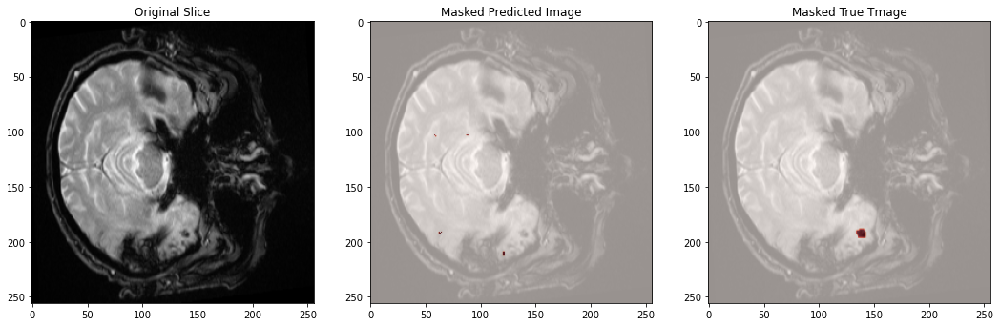

slice  13
dice loss:  0.5776119232177734
dice score:  0.42238807678222656


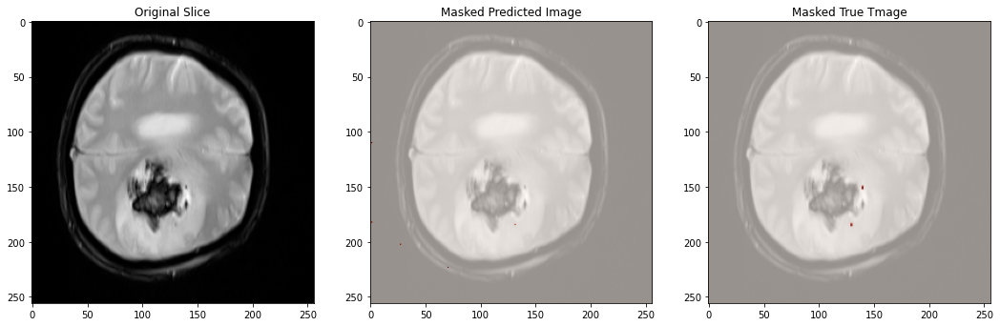

slice  14
dice loss:  0.5775606632232666
dice score:  0.4224393367767334


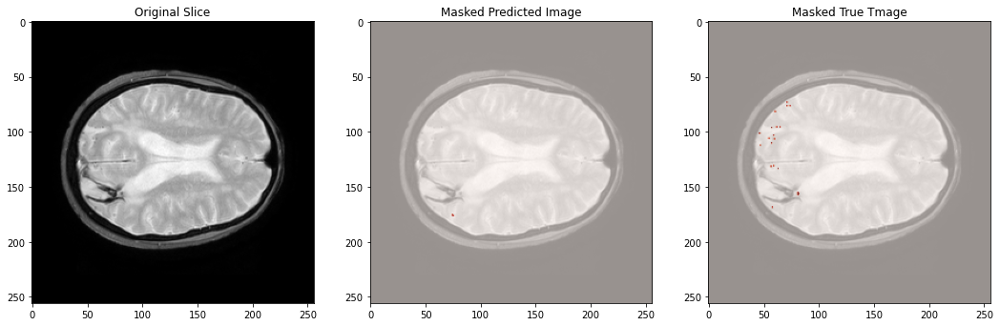

slice  15
dice loss:  0.5774986147880554
dice score:  0.4225013852119446


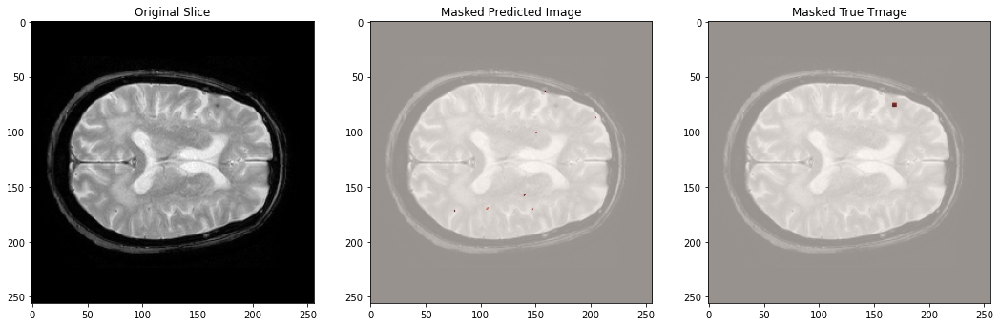

slice  16
dice loss:  0.5773778557777405
dice score:  0.4226221442222595


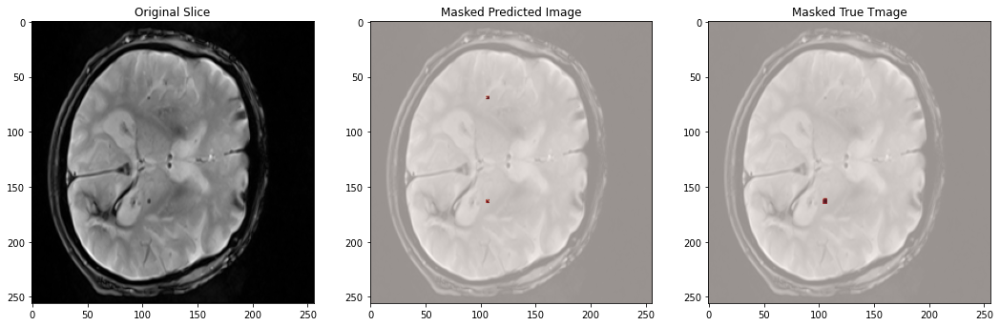

slice  17
dice loss:  0.5775141716003418
dice score:  0.4224858283996582


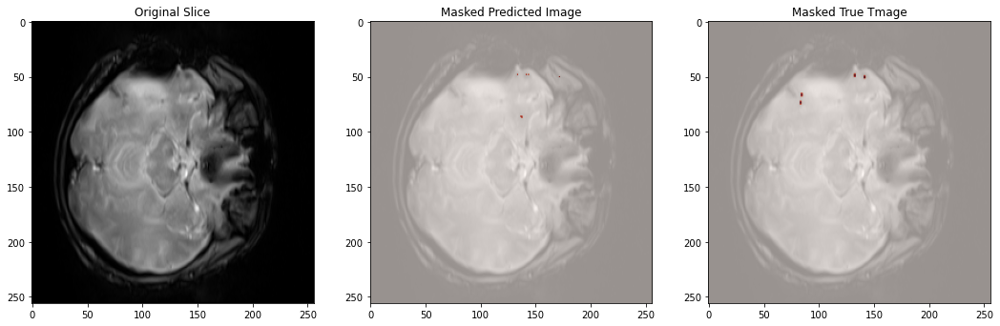

slice  18
dice loss:  0.5777021050453186
dice score:  0.4222978949546814


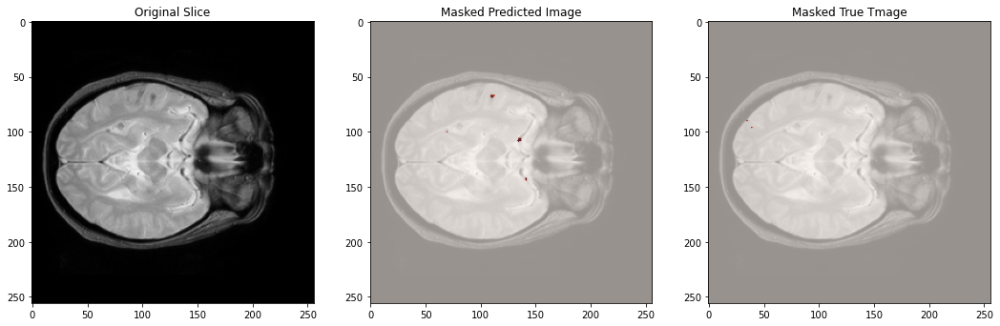

slice  19
dice loss:  0.5773544311523438
dice score:  0.42264556884765625


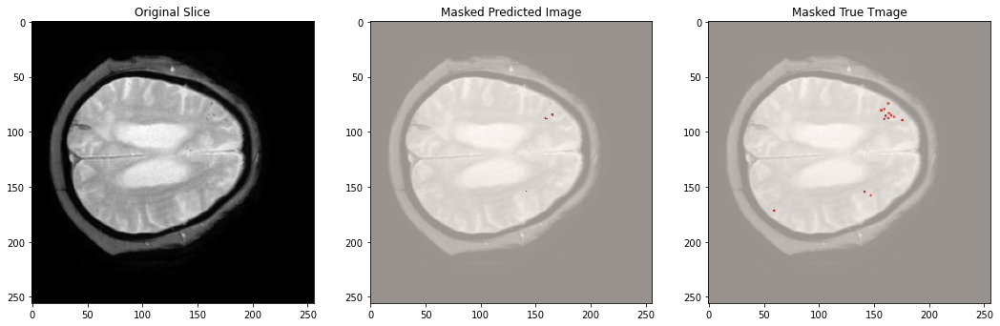

slice  20
dice loss:  0.5776316523551941
dice score:  0.4223683476448059


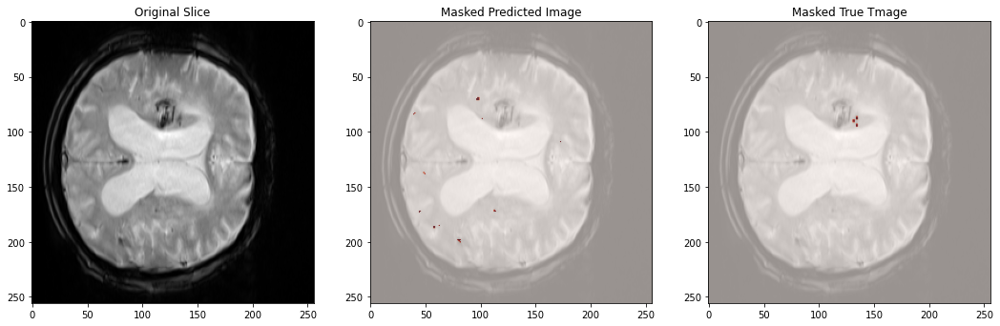

slice  21
dice loss:  0.5771833658218384
dice score:  0.4228166341781616


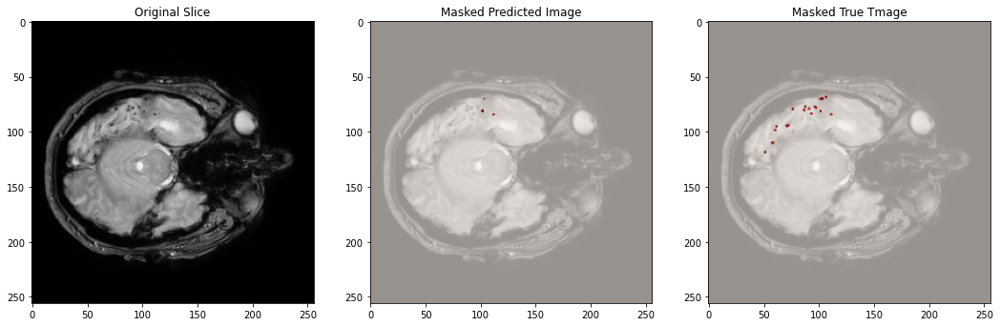

slice  22
dice loss:  0.5771799683570862
dice score:  0.4228200316429138


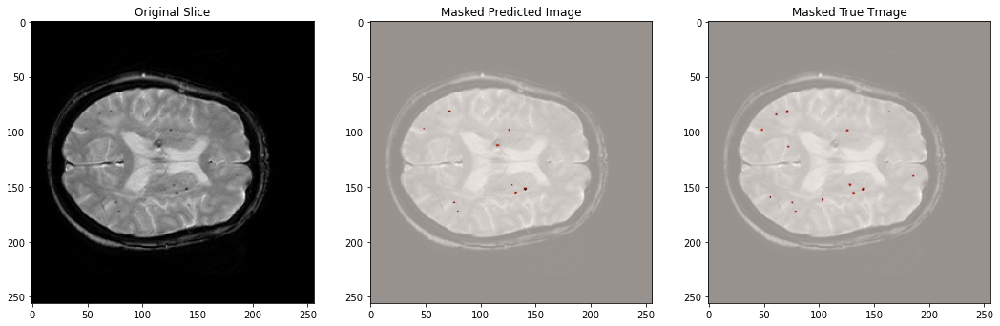

slice  23
dice loss:  0.5776076316833496
dice score:  0.4223923683166504


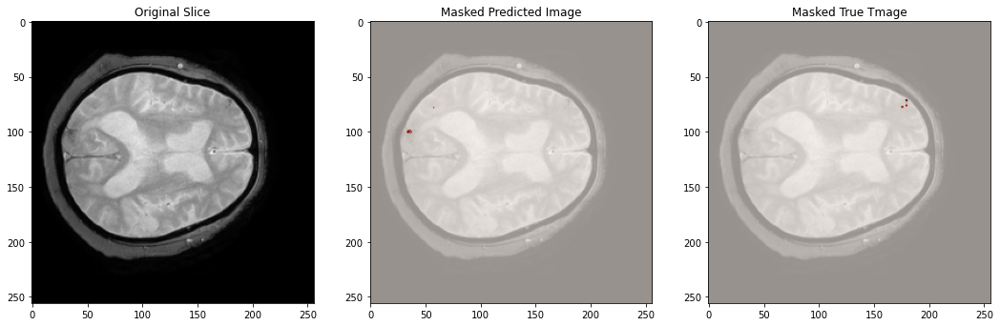

slice  24
dice loss:  0.5775259733200073
dice score:  0.4224740266799927


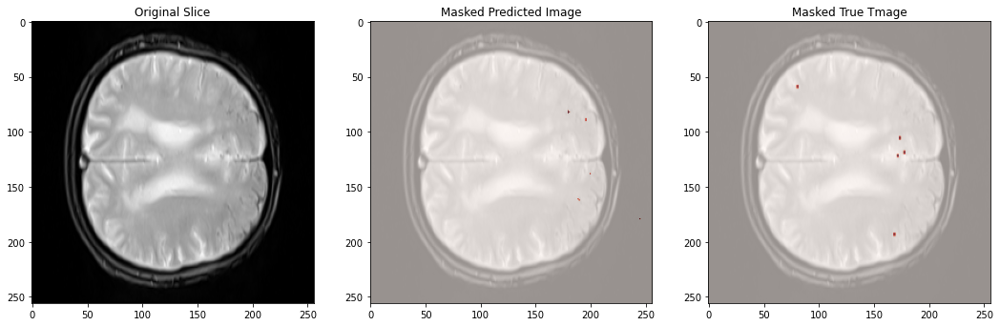

slice  25
dice loss:  0.5774720907211304
dice score:  0.42252790927886963


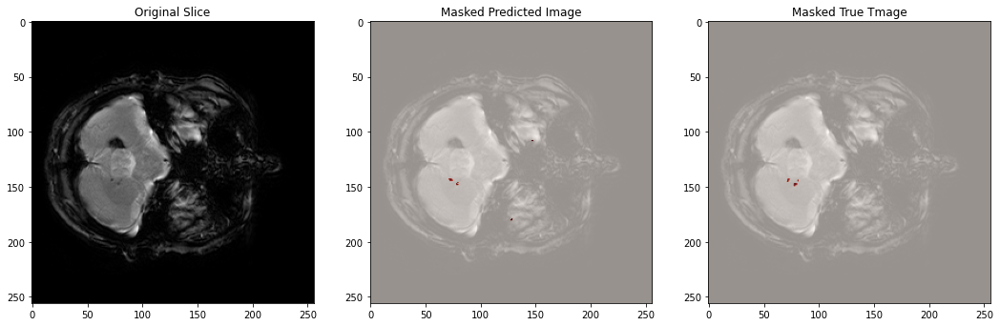

slice  26
dice loss:  0.5775858163833618
dice score:  0.4224141836166382


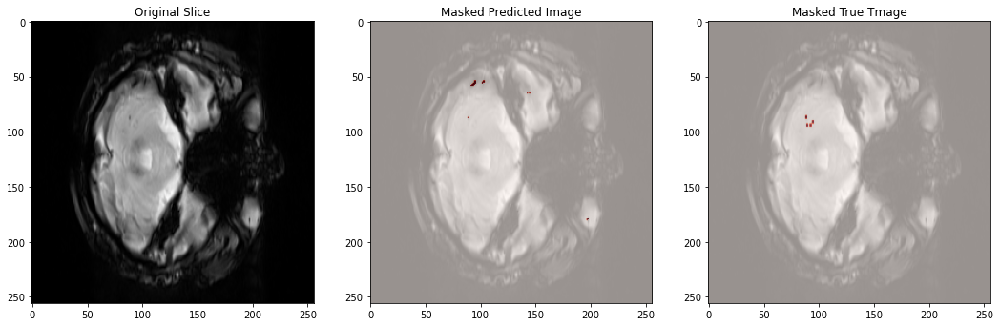

slice  27
dice loss:  0.5773504972457886
dice score:  0.4226495027542114


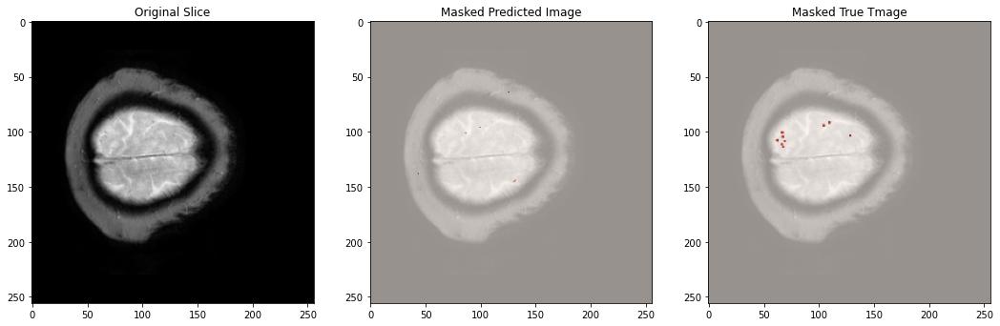

slice  28
dice loss:  0.5776420831680298
dice score:  0.4223579168319702


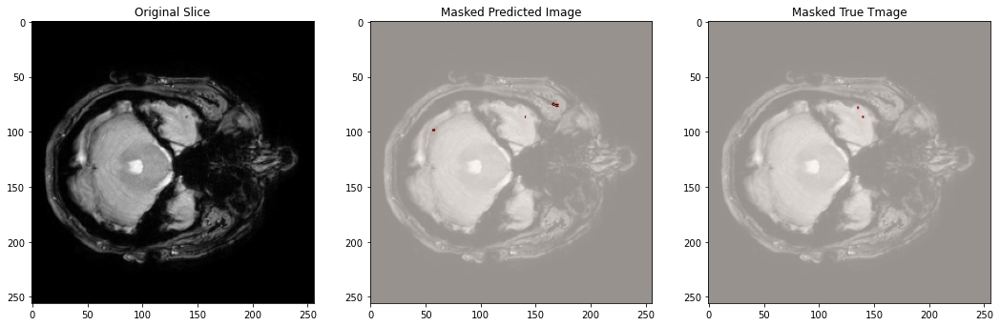

slice  29
dice loss:  0.5772804021835327
dice score:  0.4227195978164673


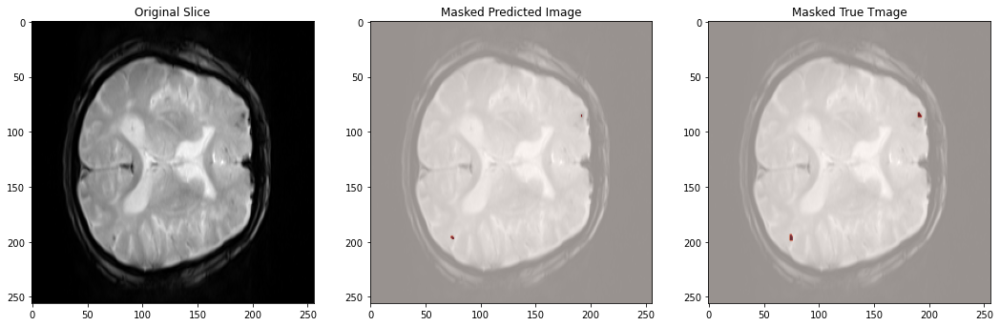

slice  30
dice loss:  0.5774973630905151
dice score:  0.42250263690948486


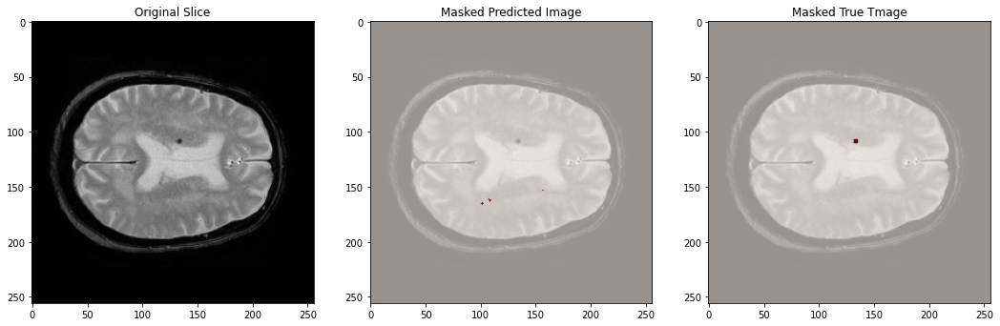

slice  31
dice loss:  0.5772624015808105
dice score:  0.42273759841918945


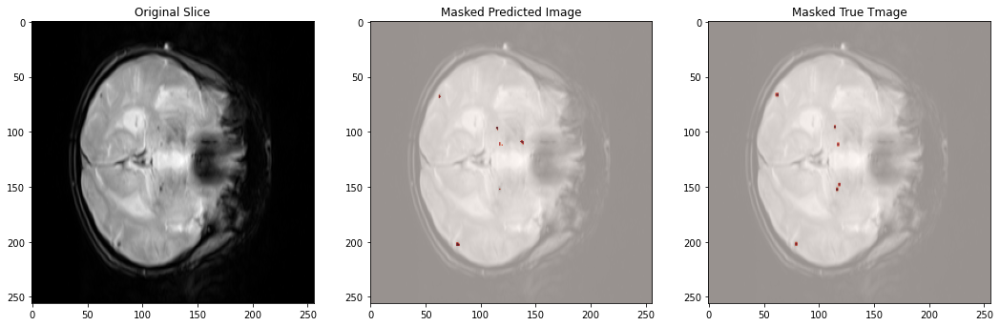

slice  32
dice loss:  0.5772727727890015
dice score:  0.42272722721099854


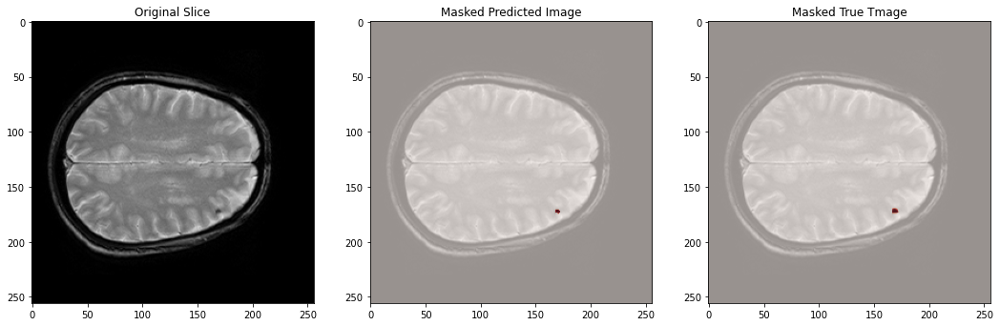

slice  33
dice loss:  0.5773544311523438
dice score:  0.42264556884765625


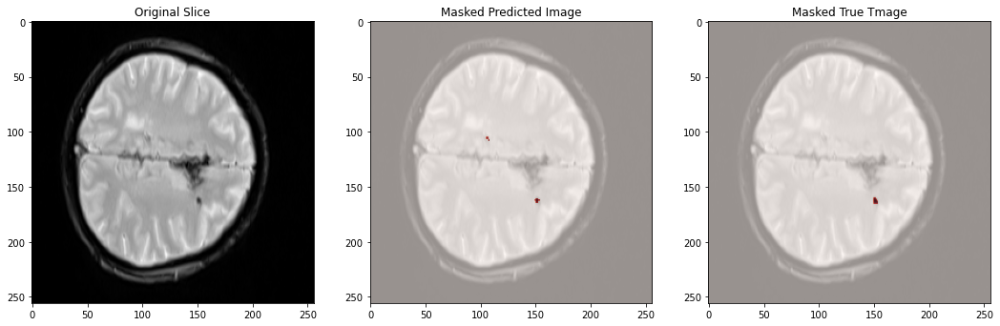

slice  34
dice loss:  0.5771732330322266
dice score:  0.42282676696777344


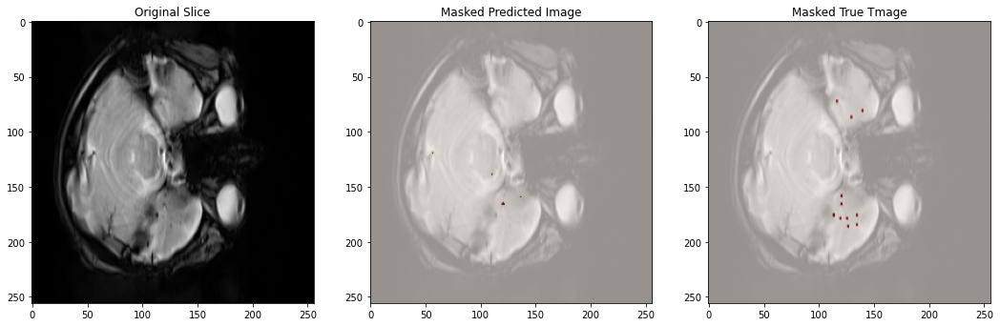

slice  35
dice loss:  0.5776574611663818
dice score:  0.42234253883361816


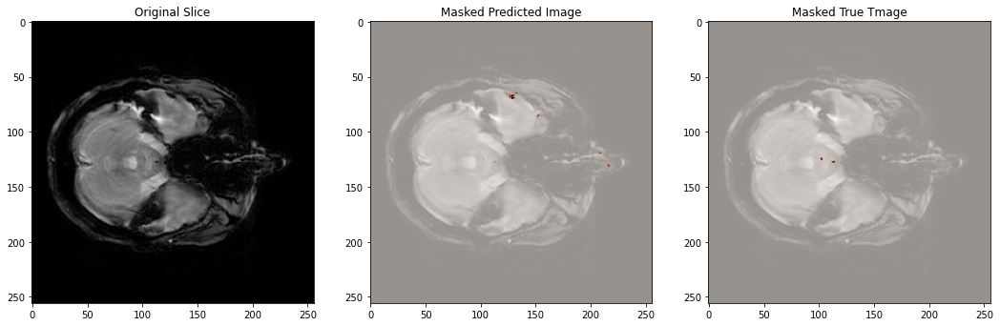

slice  36
dice loss:  0.5775671005249023
dice score:  0.42243289947509766


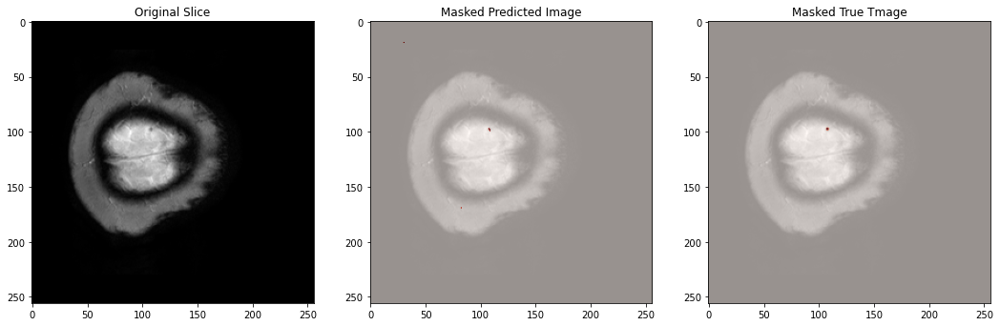

slice  37
dice loss:  0.57697594165802
dice score:  0.42302405834198


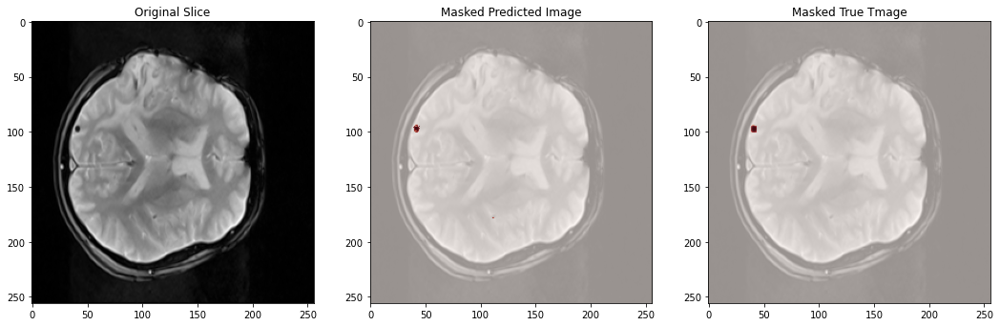

slice  38
dice loss:  0.5760075449943542
dice score:  0.42399245500564575


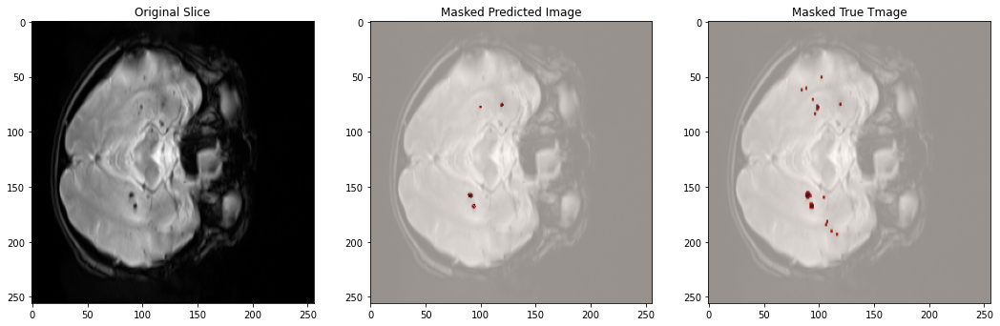

slice  39
dice loss:  0.5763905048370361
dice score:  0.42360949516296387


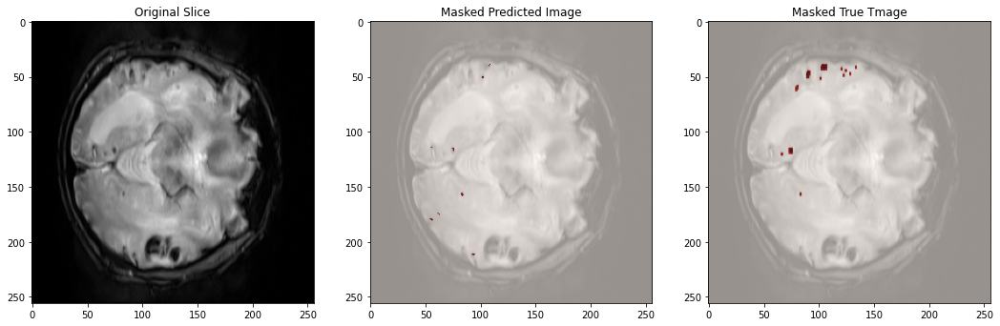

slice  40
dice loss:  0.5775167942047119
dice score:  0.4224832057952881


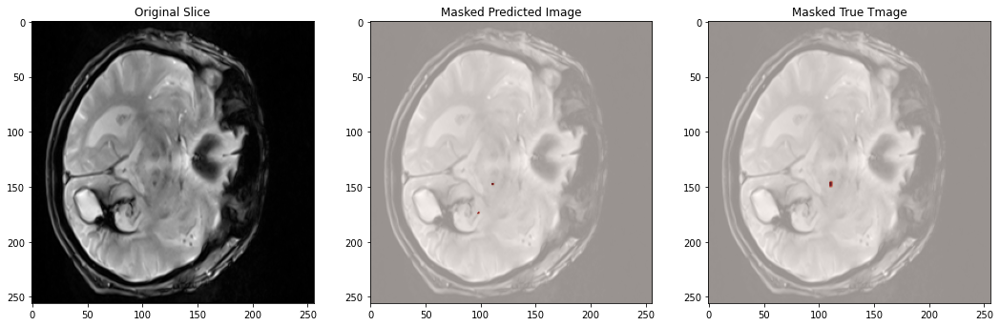

slice  41
dice loss:  0.5774108171463013
dice score:  0.42258918285369873


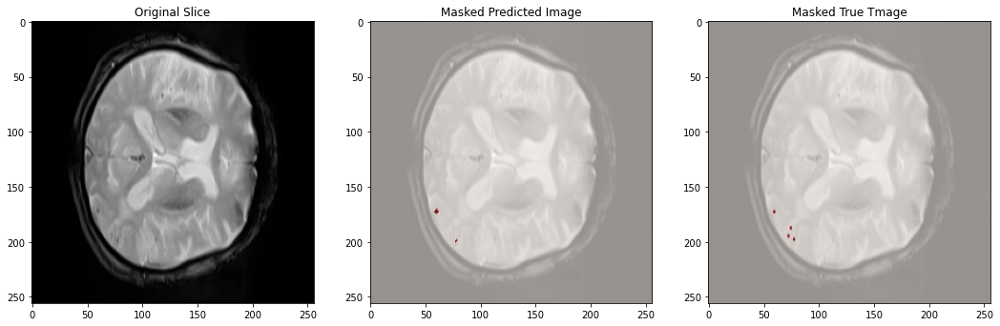

slice  42
dice loss:  0.5768212080001831
dice score:  0.4231787919998169


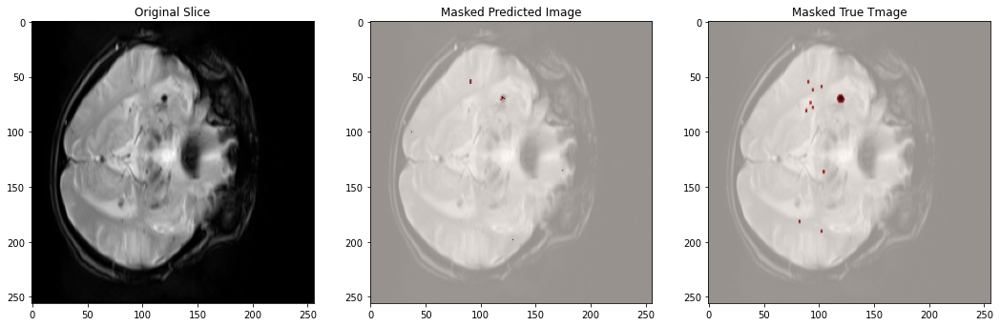

slice  43
dice loss:  0.5776804685592651
dice score:  0.42231953144073486


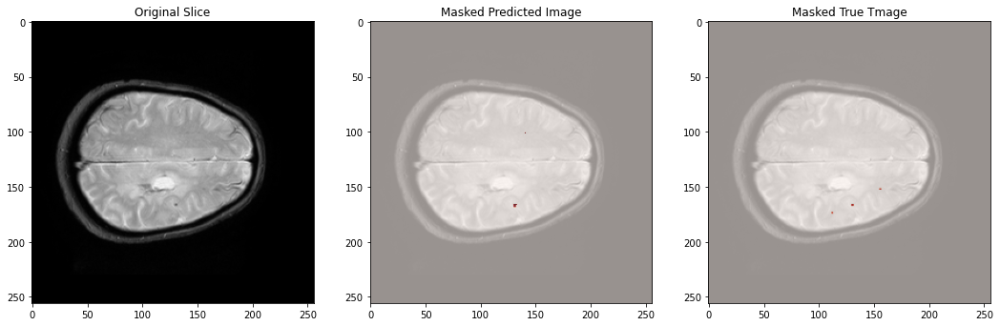

slice  44
dice loss:  0.5776793956756592
dice score:  0.4223206043243408


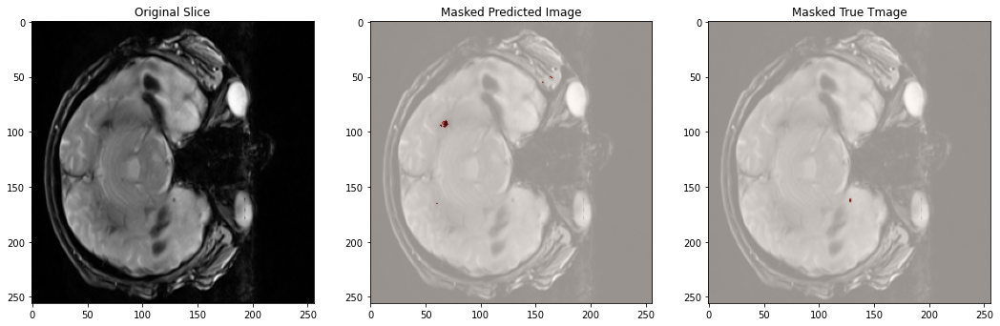

slice  45
dice loss:  0.5776792764663696
dice score:  0.42232072353363037


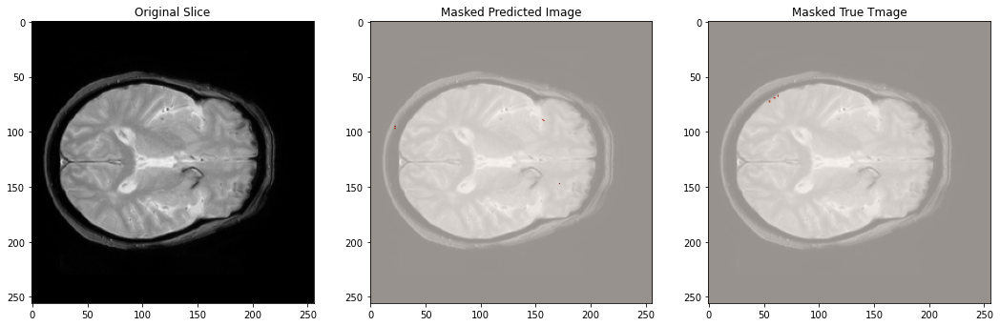

slice  46
dice loss:  0.5774232745170593
dice score:  0.4225767254829407


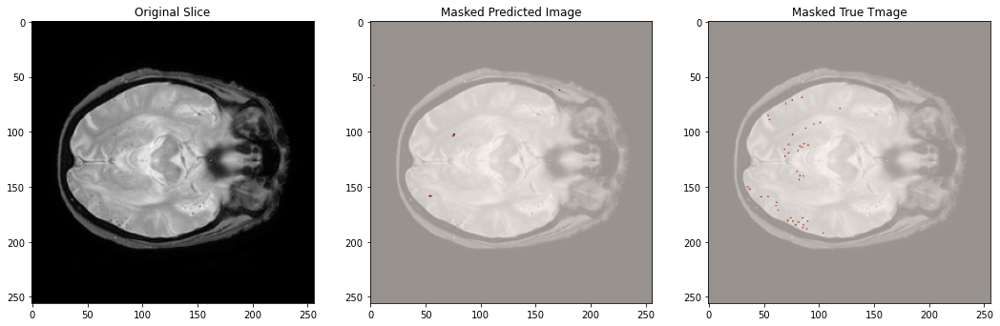

slice  47
dice loss:  0.5770324468612671
dice score:  0.4229675531387329


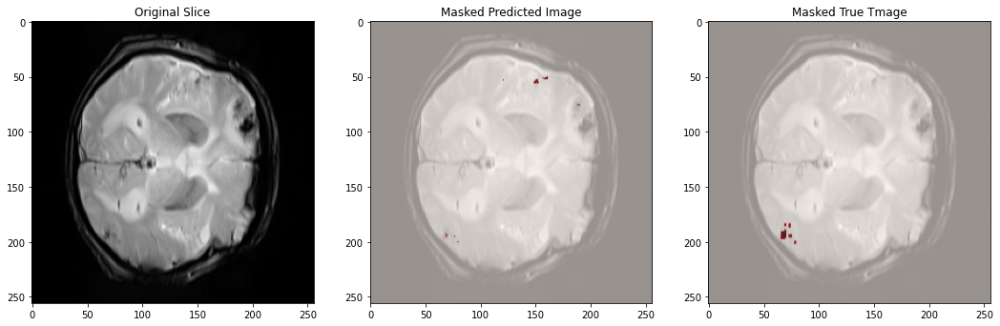

slice  48
dice loss:  0.5776722431182861
dice score:  0.42232775688171387


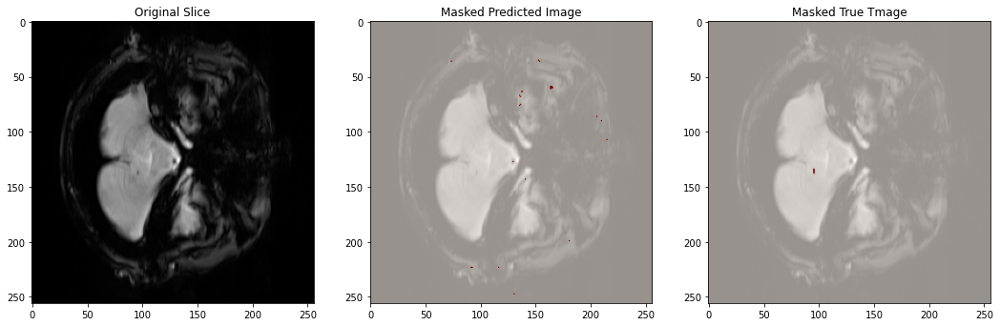

slice  49
dice loss:  0.5767582654953003
dice score:  0.4232417345046997


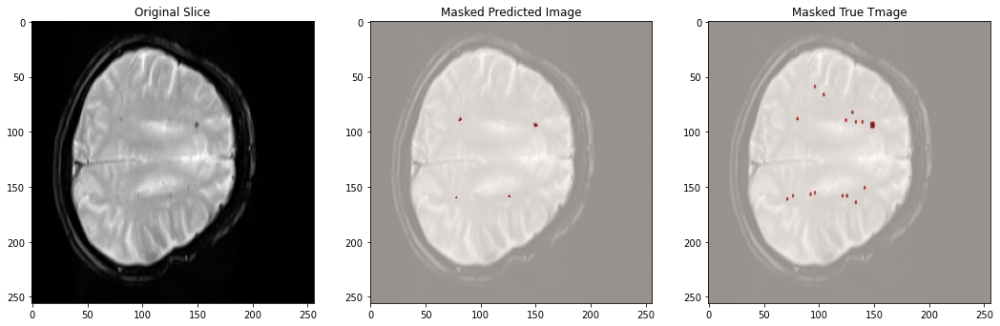

slice  50
dice loss:  0.577562153339386
dice score:  0.422437846660614


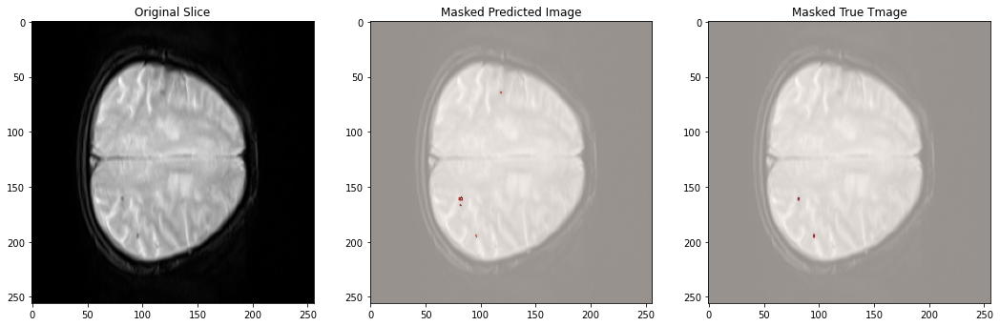

slice  51
dice loss:  0.5768002271652222
dice score:  0.42319977283477783


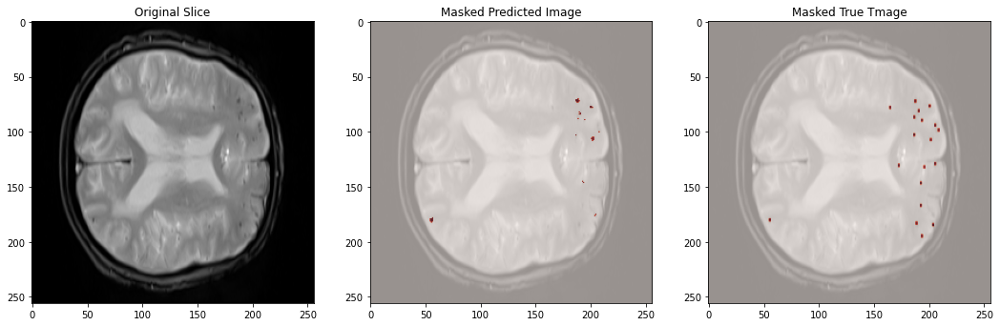

slice  52
dice loss:  0.577405571937561
dice score:  0.42259442806243896


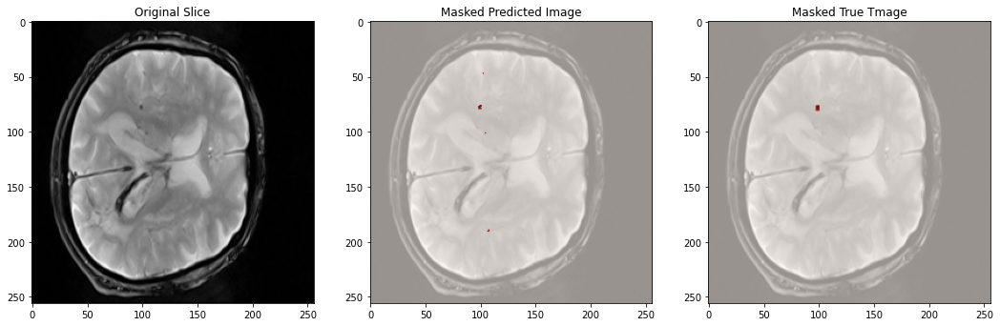

slice  53
dice loss:  0.5775836706161499
dice score:  0.4224163293838501


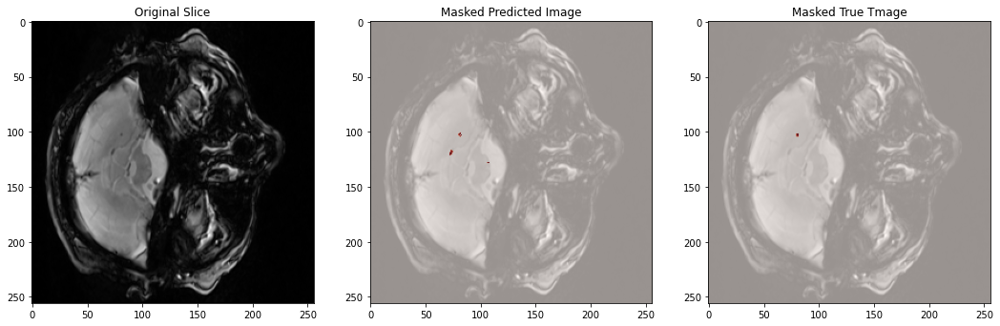

In [19]:
def plotscan(img, prediction, mask):
    plt.figure("Check", (3*6, 6))
    plt.axis('off')
    plt.grid(b = None)
    plt.subplot(1, 3, 1)
    plt.title(f"Original Slice")
    plt.imshow(img[0,0], cmap = plt.get_cmap('gray'))
    plt.subplot(1, 3, 2)
    plt.title("Masked Predicted Image")
    plt.imshow(img[0,0], cmap = plt.get_cmap('gray'))
    plt.imshow(prediction[0,1], cmap = 'Reds', alpha = 0.6)
    plt.subplot(1, 3, 3)
    plt.title("Masked True Tmage")
    plt.imshow(img[0,0], cmap = plt.get_cmap('gray'))
    plt.imshow(mask[0,0], cmap = 'Reds', alpha = 0.6)
    plt.show()

# fazer uma previsão utilizando um caso
def make_prediction_full(model_classification, model_segmentation, img_in, mask_in, loss_function):
    predictions_seg = []
    actual_values_seg = []
    dicelosstotal = 0
    dicescoretotal = 0
    TRESHOLD = 0.1
    for i, img in enumerate(img_in):
        print("slice ", i)
        #img = img_in[i]
        mask = mask_in[i]
        img = img.to(DEVICE)
        img = img[None, :]
        mask = mask[None, :]
        macro_detected = img_with_without_macro(img, model_classification) 
        if macro_detected == 1:
            prediction = model_segmentation(img).cpu().detach()
            prediction_binary = predict_segmentation(prediction, mutually_exclusive=True, threshold=0)
            #mask_numpy = mask.numpy()
            mask_numpy = np.float32(mask)
            prediction_binary_numpy = np.float32(prediction_binary)
            predictions_seg.append(prediction_binary_numpy)
            actual_values_seg.append(mask_numpy)
            dice = loss_function(prediction, mask)
            print("dice loss: ", dice.item())
            dicelosstotal = dicelosstotal + dice.item()
            dicescore = 1 - dice.item()
            print("dice score: ", dicescore)
            dicescoretotal = dicescoretotal + dicescore
            img = img.cpu() 
            #print(classification_report(mask, prediction_binary))
            #cr = classification_report(mask, prediction_binary, output_dict = True)
            plotscan(img, prediction, mask)
        else:
            print("macrohemorrhage not detected in this slice")
    return predictions_seg, actual_values_seg, dicelosstotal, dicescoretotal

def make_prediction( model, img_in, mask_in, loss_function):
    predictions_seg = []
    actual_values_seg = []
    dicelosstotal = 0
    dicescoretotal = 0
    TRESHOLD = 0.4
    for i, img in enumerate(img_in):
        print("slice ", i)
        mask = mask_in[i]
        img = img.to(DEVICE)
        img = img[None, :]
        mask = mask[None, :] 
        prediction = model(img).cpu().detach()
        
        prediction_binary = predict_segmentation(prediction, mutually_exclusive = True, threshold = 0)
        mask_numpy = np.float32(mask)
        prediction_binary_numpy = np.float32(prediction_binary)
        predictions_seg.append(prediction_binary_numpy)
        actual_values_seg.append(mask_numpy)
        prediction = np.where(prediction > TRESHOLD, 1, 0)
        dice = loss_function(torch.tensor(np.float32(prediction)), mask)
        print("dice loss: ", dice.item())
        dicelosstotal = dicelosstotal + dice.item()
        dicescore = 1 - dice.item()
        print("dice score: ", dicescore)
        dicescoretotal = dicescoretotal + dicescore
        img = img.cpu() 
        
        plotscan(img, prediction, mask)
    return predictions_seg, actual_values_seg, dicelosstotal, dicescoretotal

model, _, _ = load_ckp(get_best_checkpoint("segmentation"), model, optimizer)
check_data = next(iter(val_loader_all))
image, mask, label = (check_data["scan"], check_data["mask"], check_data["label"])
predictions_seg, actual_values_seg, dicelosstotal, dicescoretotal = make_prediction(model, image, mask, loss_function)

=> Loading checkpoint
slice  0
dice loss:  0.500056803226471
dice score:  0.49994319677352905


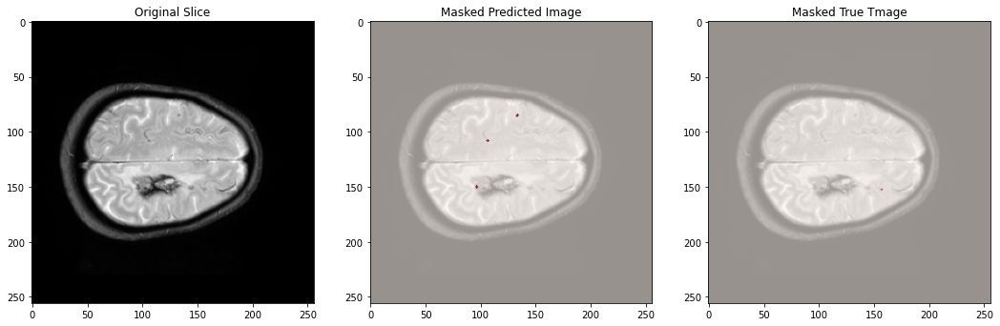

slice  1
dice loss:  0.352405846118927
dice score:  0.647594153881073


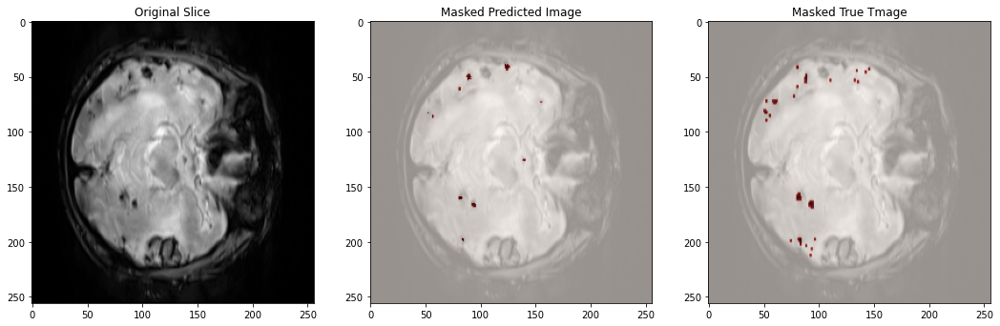

slice  2
dice loss:  0.1367986798286438
dice score:  0.8632013201713562


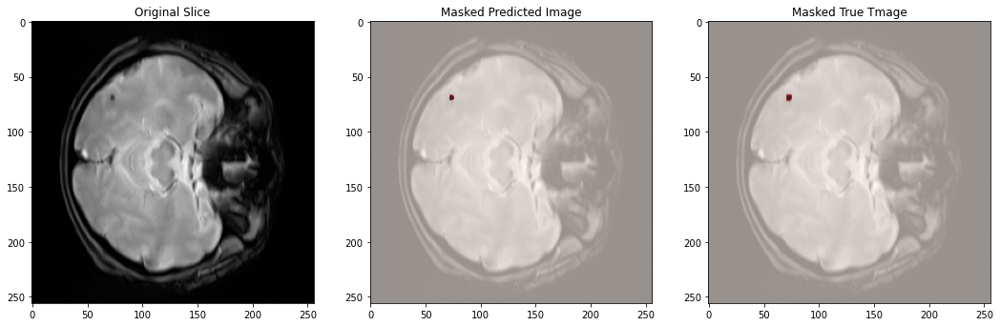

slice  3
dice loss:  0.09166491031646729
dice score:  0.9083350896835327


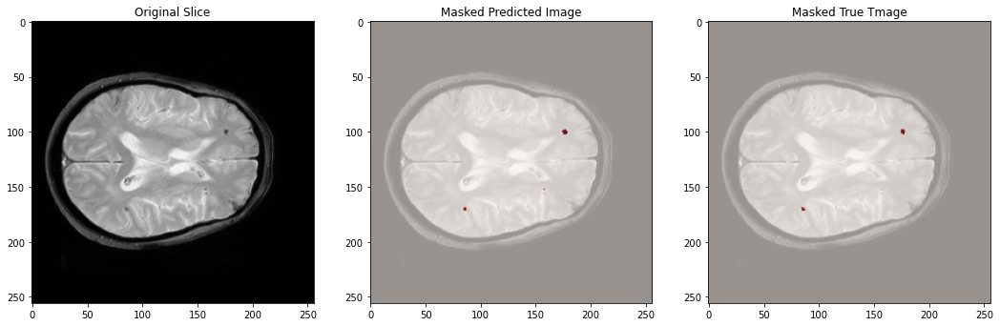

slice  4
dice loss:  0.37686195969581604
dice score:  0.623138040304184


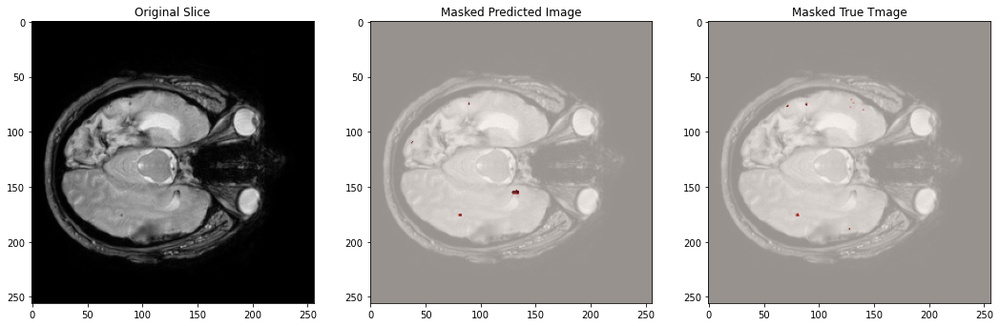

slice  5
dice loss:  0.29891741275787354
dice score:  0.7010825872421265


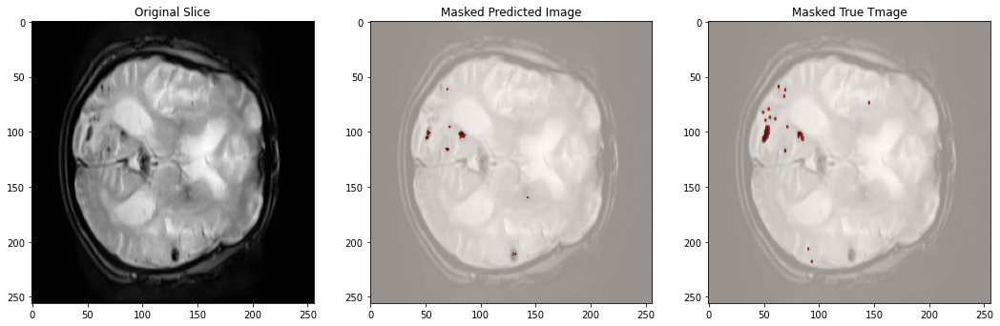

slice  6
dice loss:  0.3741113245487213
dice score:  0.6258886754512787


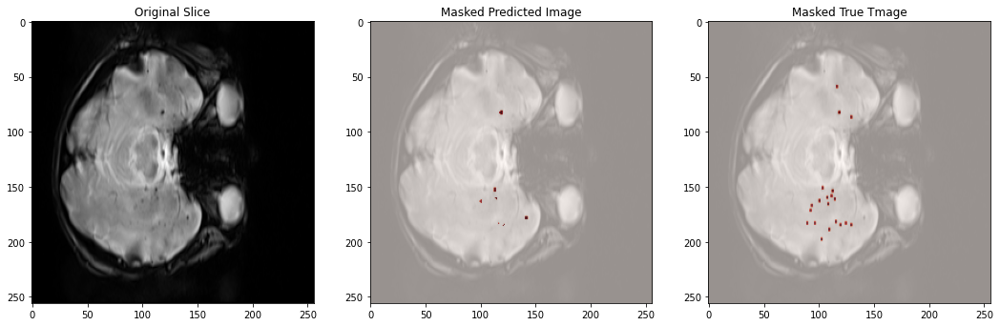

slice  7
dice loss:  0.5000682473182678
dice score:  0.4999317526817322


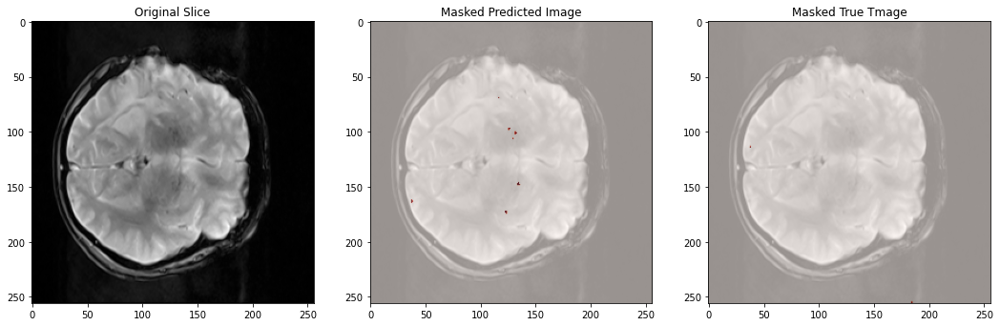

slice  8
dice loss:  0.5000187158584595
dice score:  0.4999812841415405


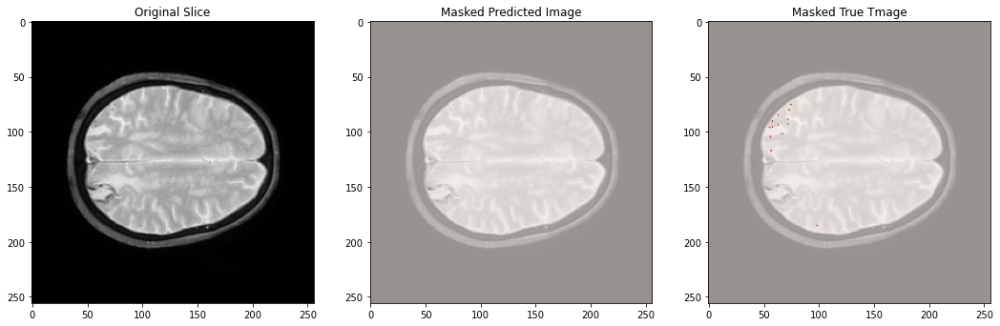

slice  9
dice loss:  0.07393896579742432
dice score:  0.9260610342025757


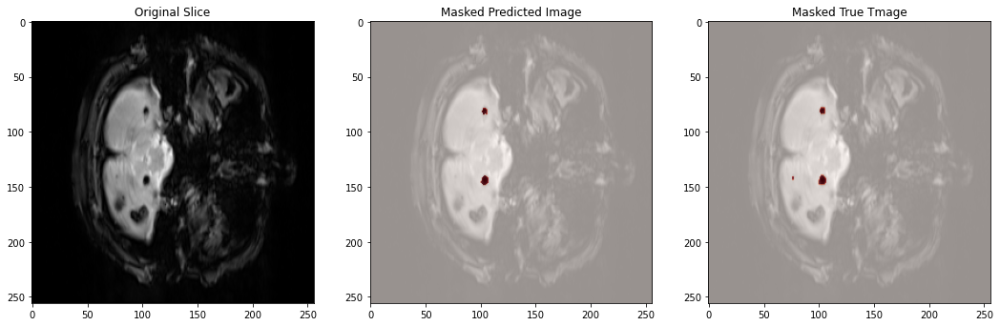

slice  10
dice loss:  0.39366087317466736
dice score:  0.6063391268253326


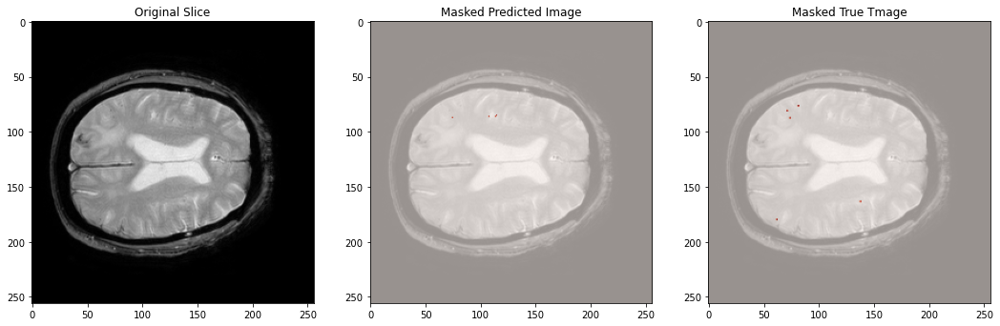

slice  11
dice loss:  0.4346994459629059
dice score:  0.5653005540370941


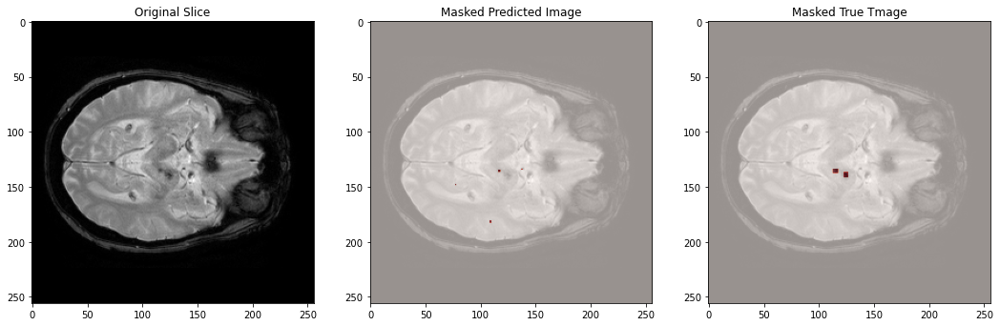

slice  12
dice loss:  0.5002020597457886
dice score:  0.4997979402542114


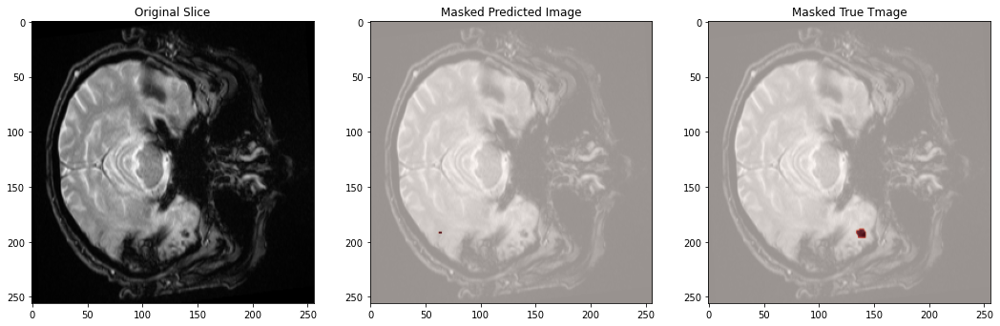

slice  13
dice loss:  0.3493412435054779
dice score:  0.6506587564945221


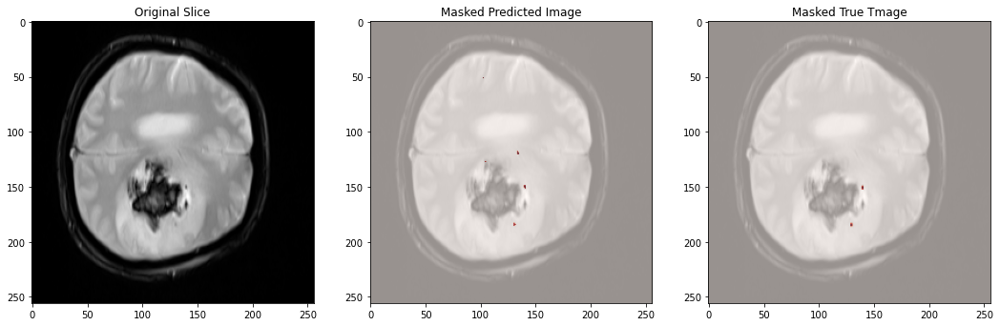

slice  14
dice loss:  0.4254104793071747
dice score:  0.5745895206928253


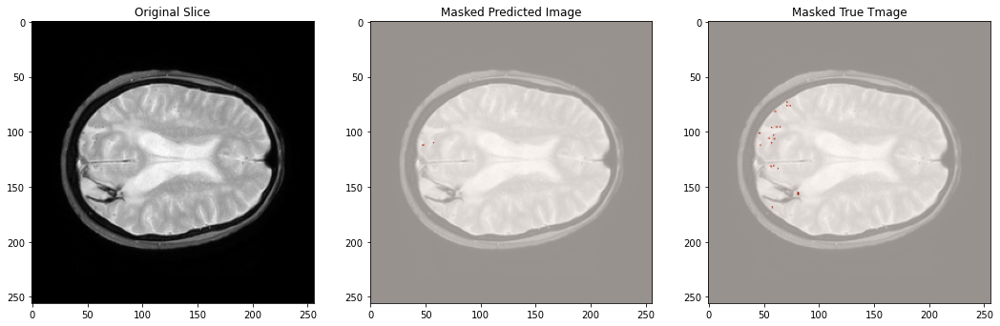

slice  15
dice loss:  0.500091552734375
dice score:  0.499908447265625


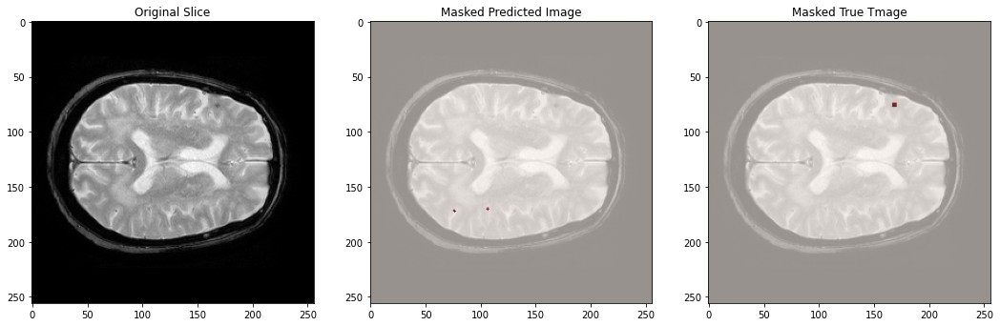

slice  16
dice loss:  0.21079358458518982
dice score:  0.7892064154148102


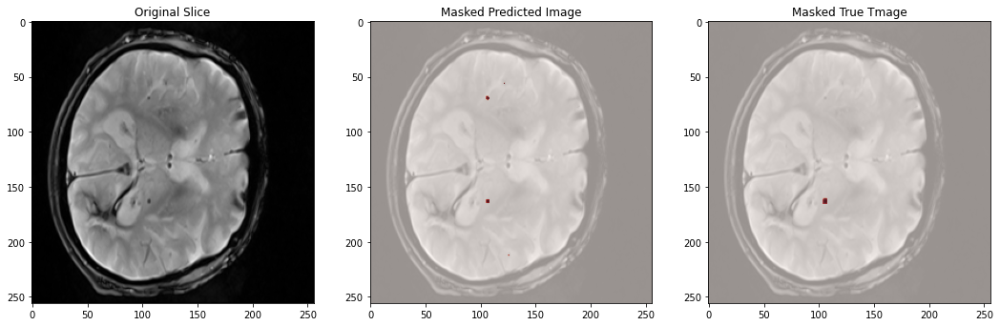

slice  17
dice loss:  0.500097393989563
dice score:  0.499902606010437


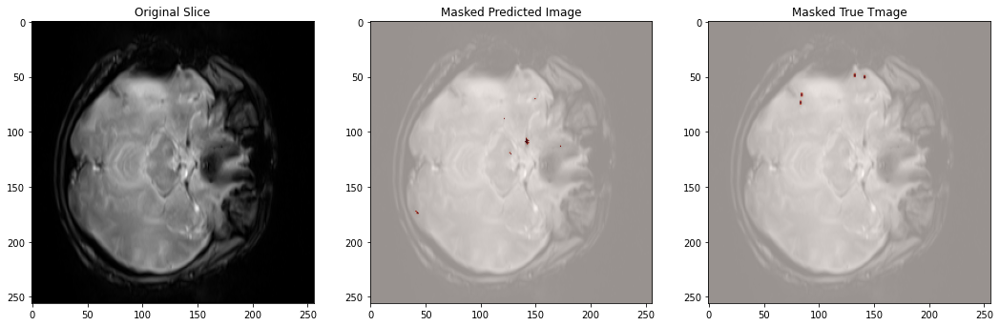

slice  18
dice loss:  0.5000723600387573
dice score:  0.4999276399612427


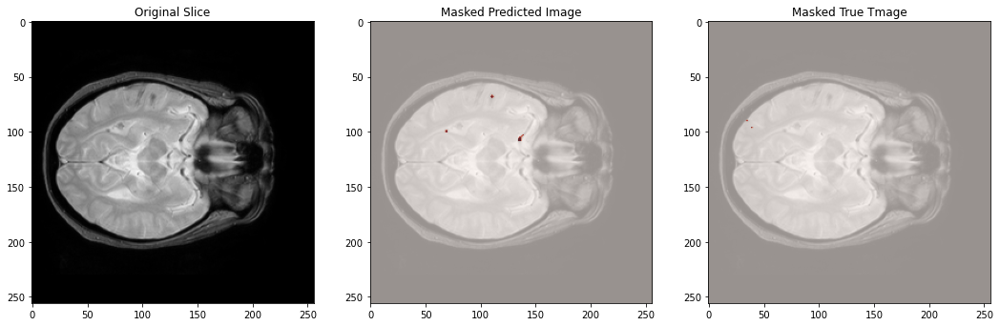

slice  19
dice loss:  0.41538822650909424
dice score:  0.5846117734909058


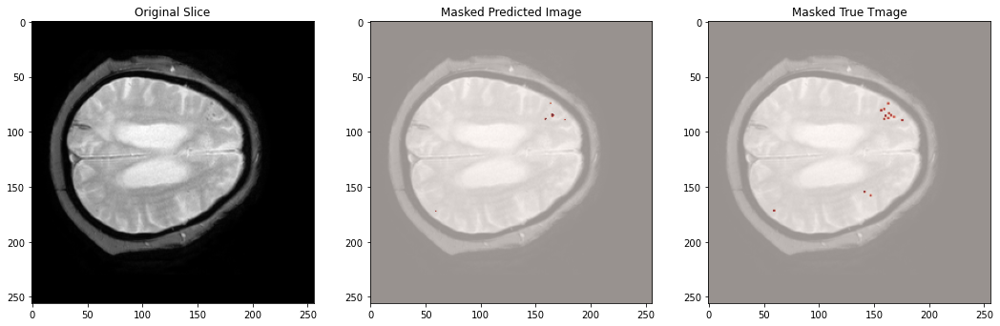

slice  20
dice loss:  0.5001112222671509
dice score:  0.4998887777328491


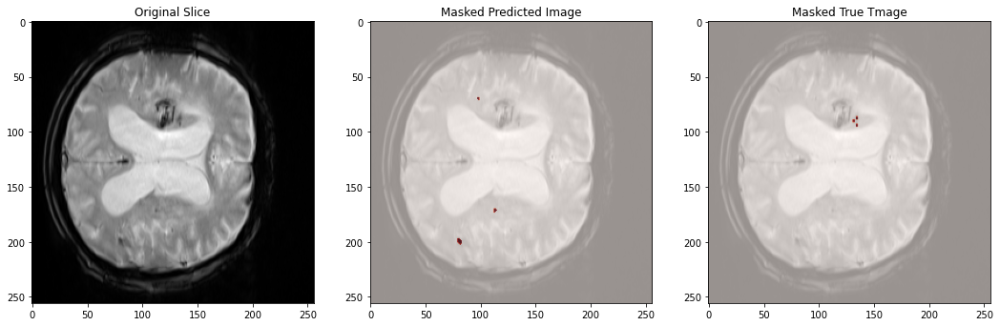

slice  21
dice loss:  0.43542224168777466
dice score:  0.5645777583122253


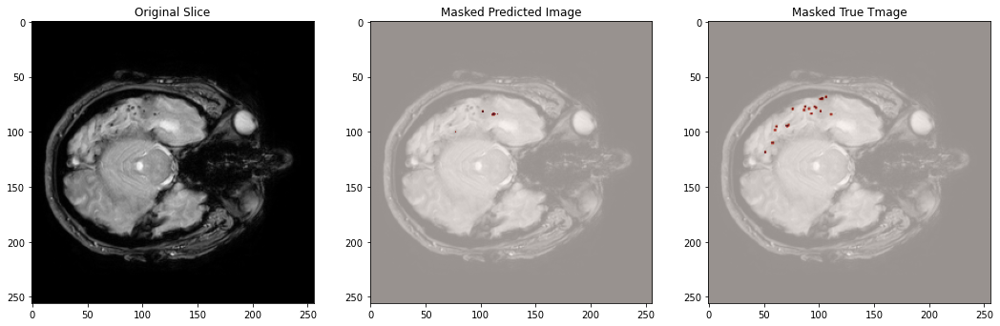

slice  22
dice loss:  0.25159066915512085
dice score:  0.7484093308448792


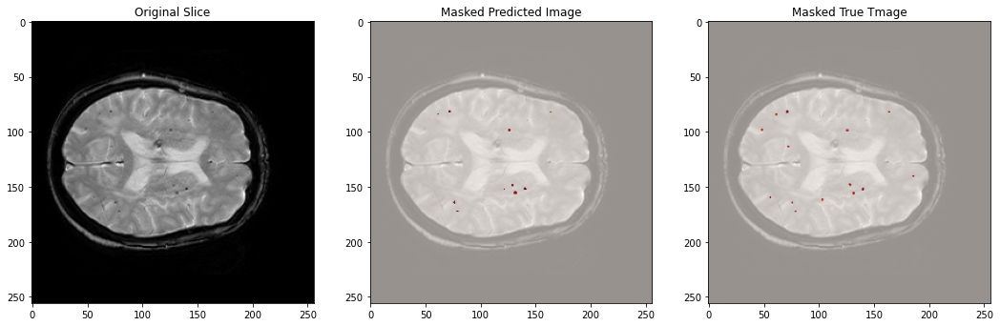

slice  23
dice loss:  0.500067412853241
dice score:  0.49993258714675903


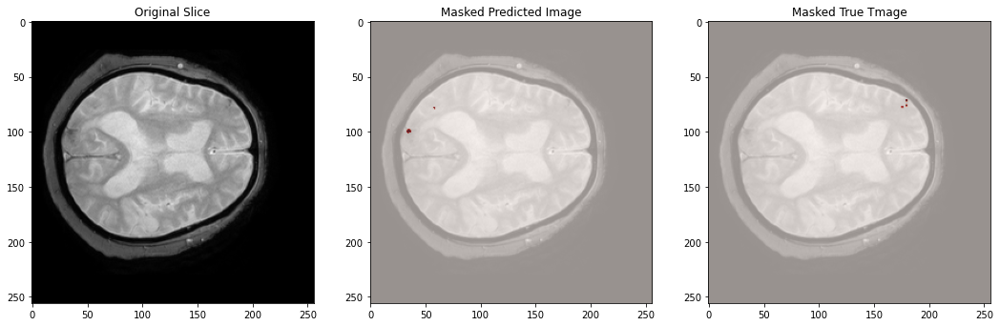

slice  24
dice loss:  0.4751985967159271
dice score:  0.5248014032840729


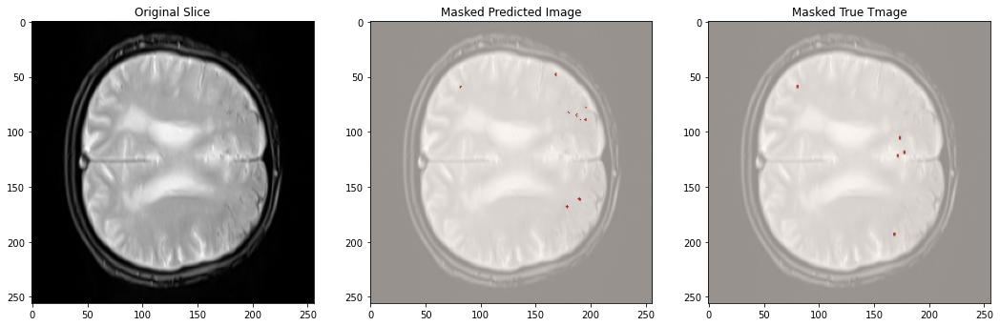

slice  25
dice loss:  0.15344911813735962
dice score:  0.8465508818626404


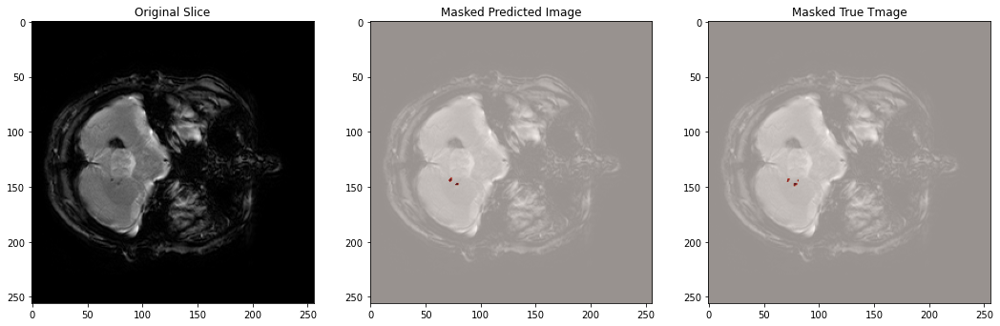

slice  26
dice loss:  0.39625903964042664
dice score:  0.6037409603595734


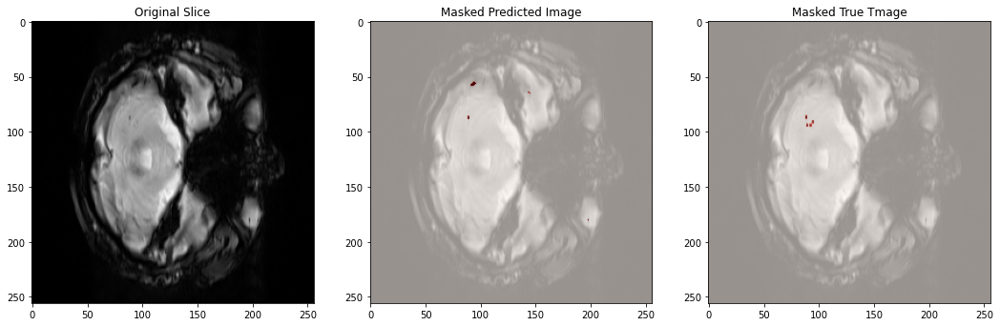

slice  27
dice loss:  0.37327346205711365
dice score:  0.6267265379428864


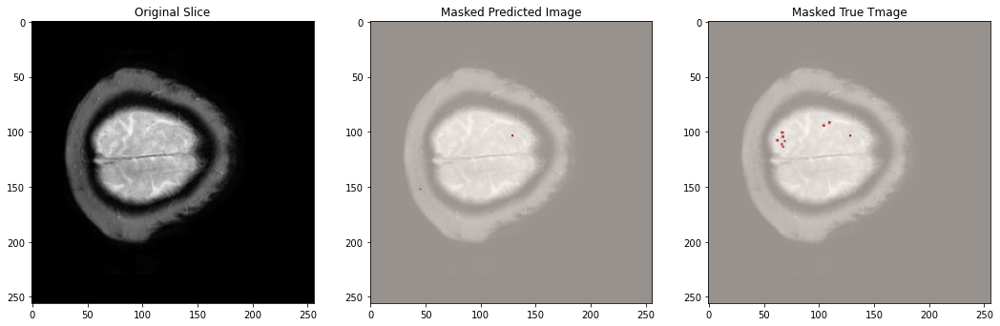

slice  28
dice loss:  0.21654769778251648
dice score:  0.7834523022174835


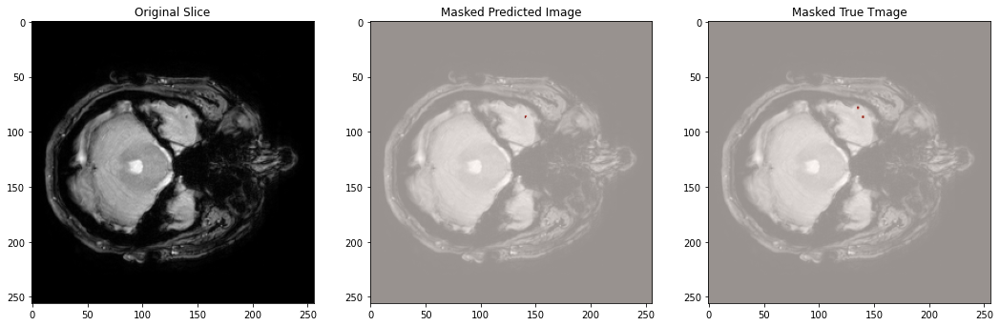

slice  29
dice loss:  0.23125246167182922
dice score:  0.7687475383281708


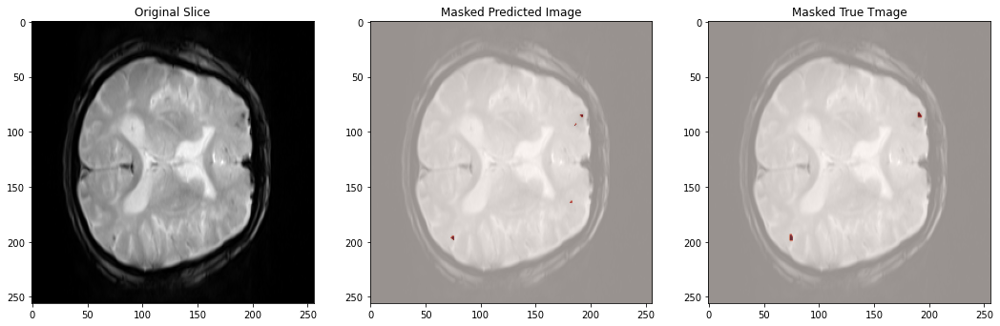

slice  30
dice loss:  0.0878414511680603
dice score:  0.9121585488319397


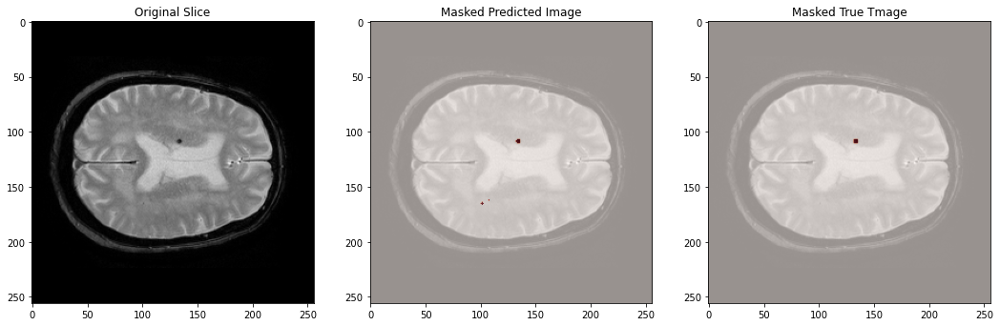

slice  31
dice loss:  0.23405560851097107
dice score:  0.7659443914890289


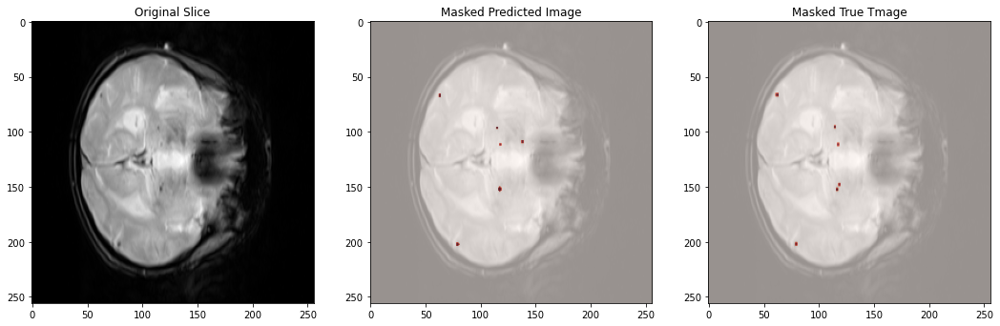

slice  32
dice loss:  0.08792948722839355
dice score:  0.9120705127716064


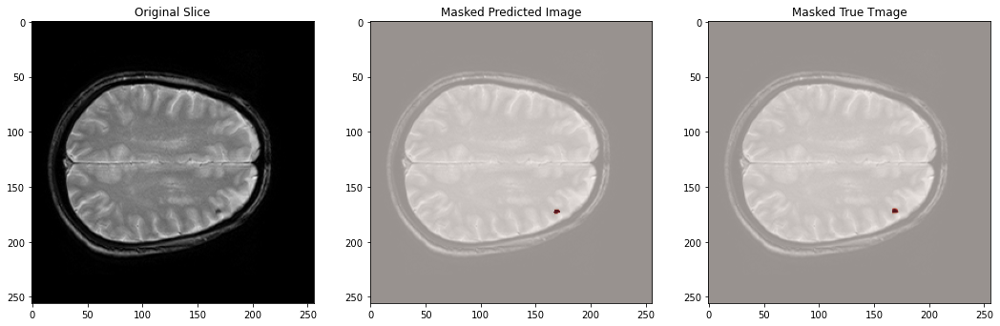

slice  33
dice loss:  0.144802063703537
dice score:  0.855197936296463


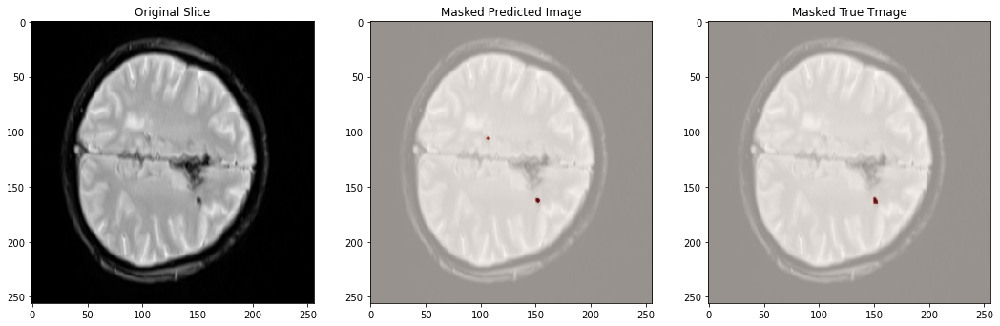

slice  34
dice loss:  0.3826860785484314
dice score:  0.6173139214515686


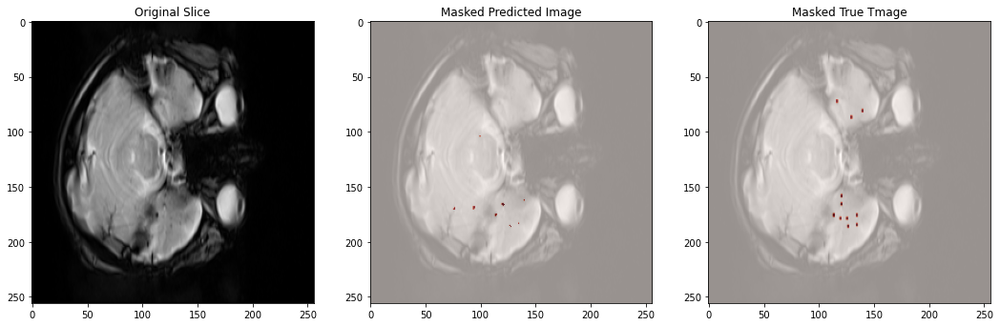

slice  35
dice loss:  0.22113129496574402
dice score:  0.778868705034256


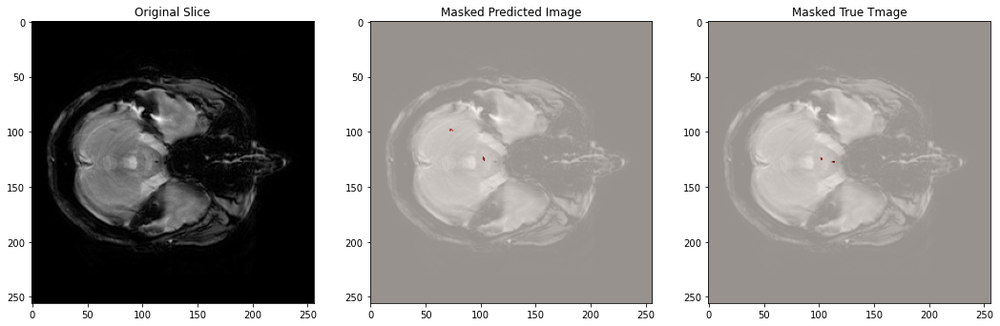

slice  36
dice loss:  0.1690368354320526
dice score:  0.8309631645679474


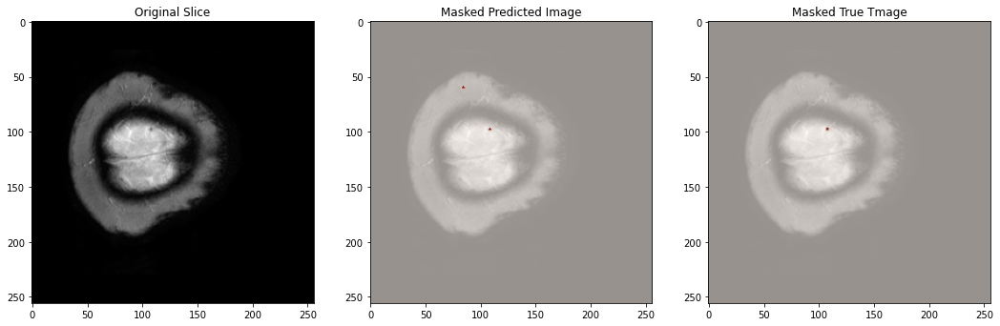

slice  37
dice loss:  0.3006507158279419
dice score:  0.6993492841720581


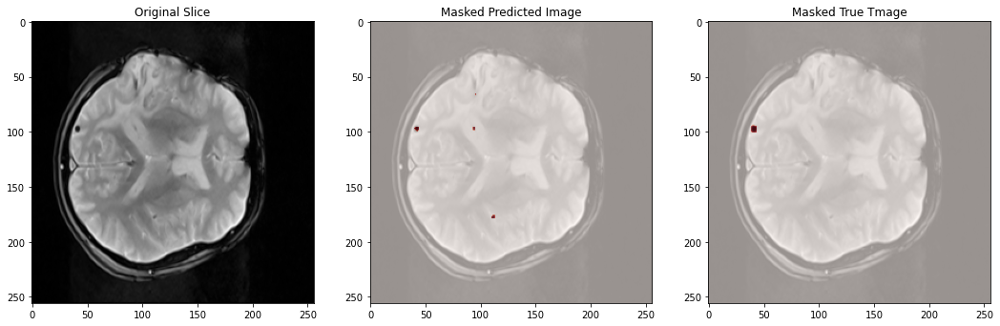

slice  38
dice loss:  0.26744845509529114
dice score:  0.7325515449047089


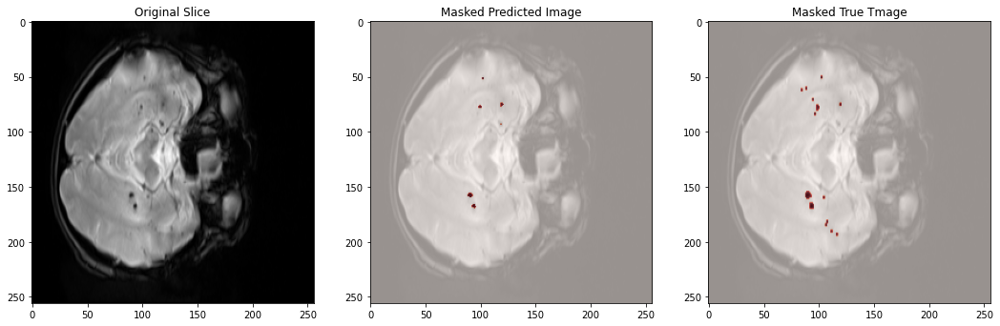

slice  39
dice loss:  0.35489174723625183
dice score:  0.6451082527637482


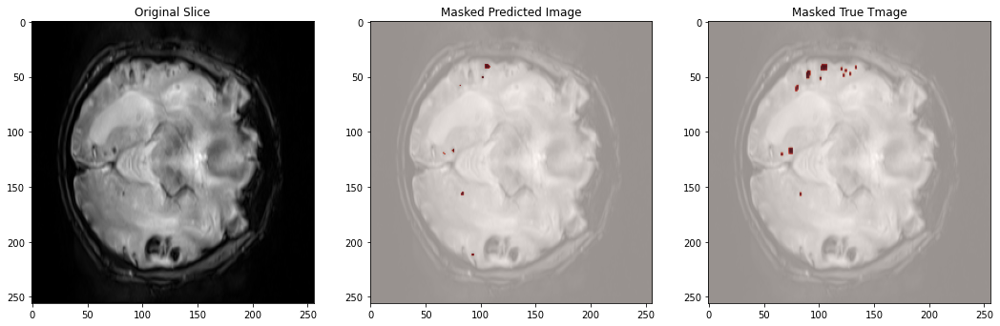

slice  40
dice loss:  0.3468342125415802
dice score:  0.6531657874584198


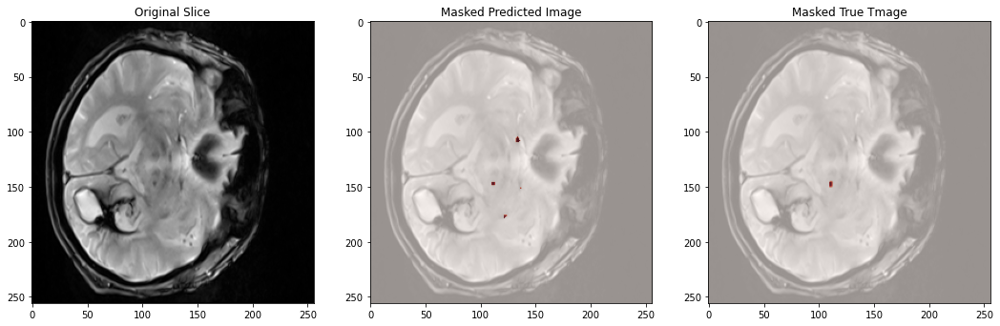

slice  41
dice loss:  0.35571587085723877
dice score:  0.6442841291427612


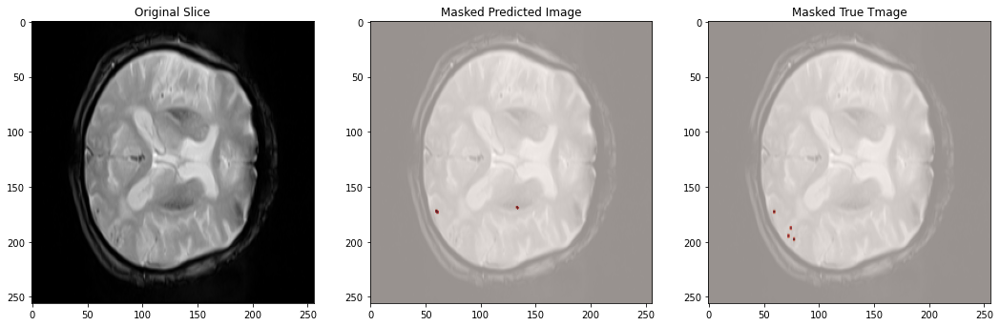

slice  42
dice loss:  0.35163211822509766
dice score:  0.6483678817749023


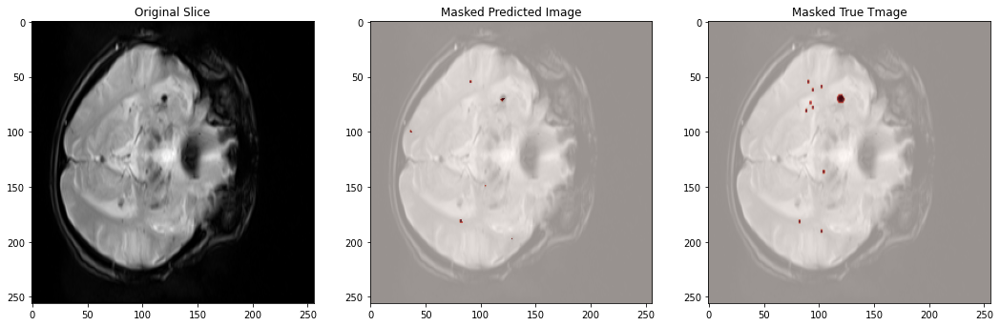

slice  43
dice loss:  0.37324297428131104
dice score:  0.626757025718689


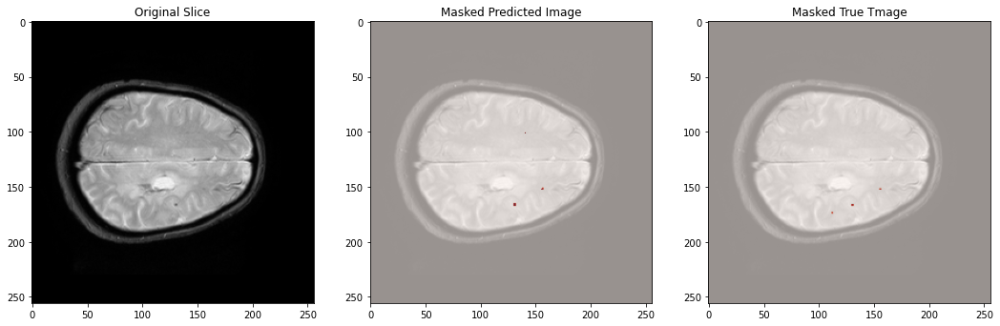

slice  44
dice loss:  0.41347536444664
dice score:  0.58652463555336


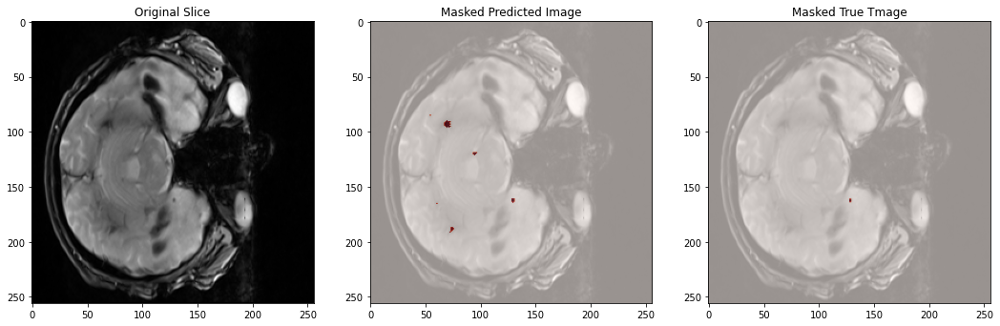

slice  45
dice loss:  0.5000427961349487
dice score:  0.49995720386505127


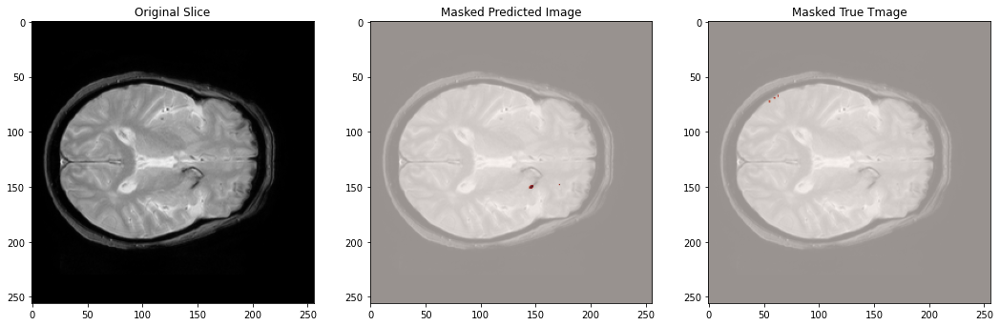

slice  46
dice loss:  0.45049768686294556
dice score:  0.5495023131370544


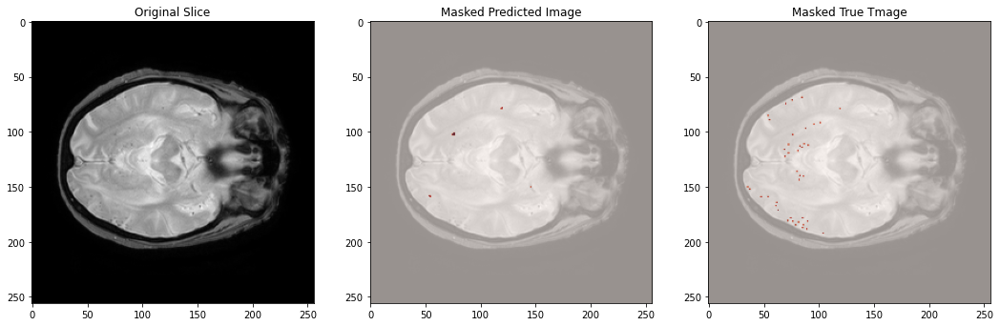

slice  47
dice loss:  0.4014471173286438
dice score:  0.5985528826713562


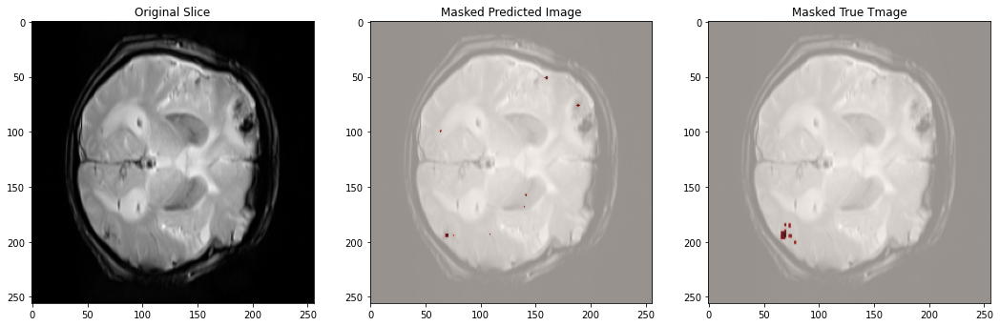

slice  48
dice loss:  0.3436485528945923
dice score:  0.6563514471054077


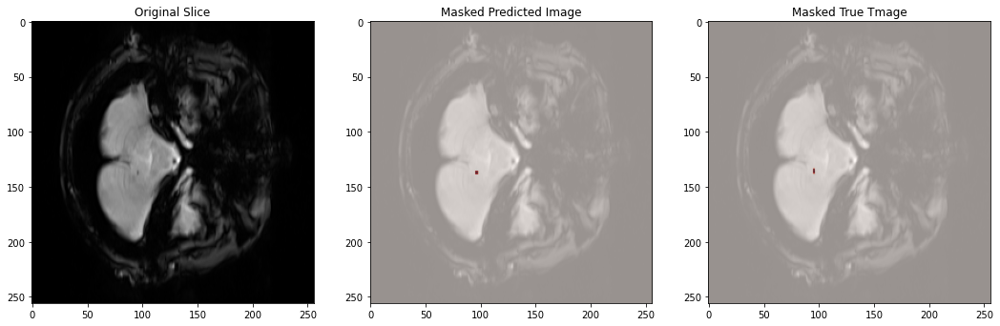

slice  49
dice loss:  0.3077830970287323
dice score:  0.6922169029712677


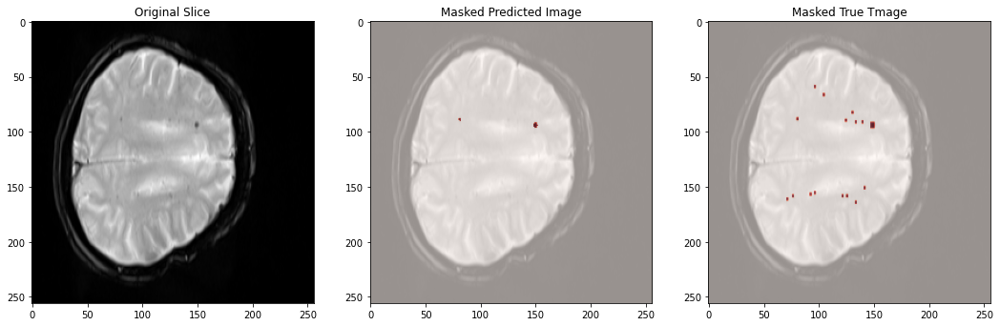

slice  50
dice loss:  0.2482393980026245
dice score:  0.7517606019973755


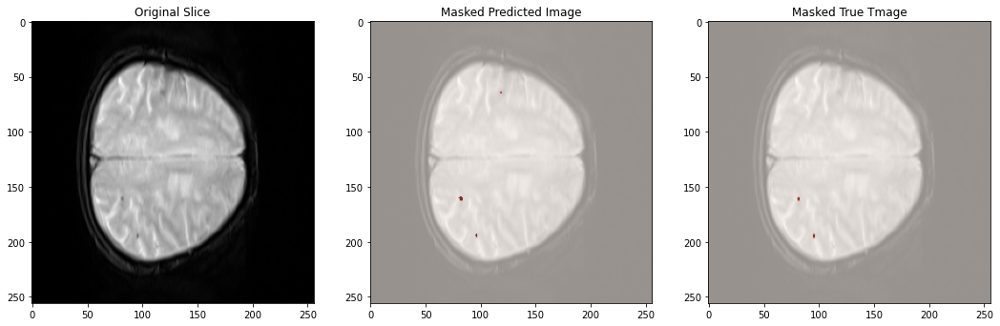

slice  51
dice loss:  0.33342334628105164
dice score:  0.6665766537189484


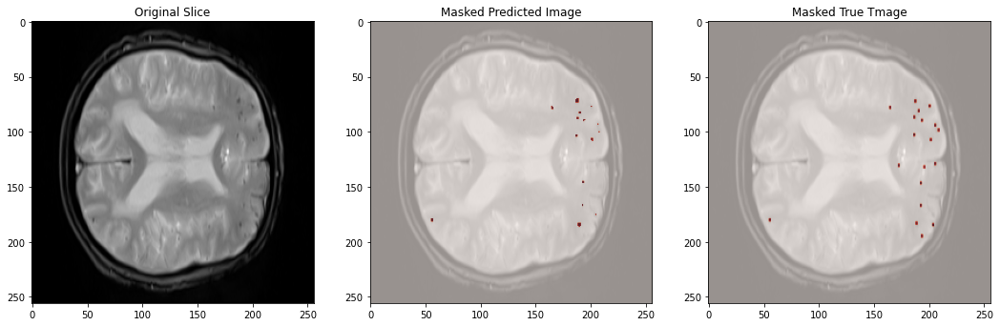

slice  52
dice loss:  0.2039051651954651
dice score:  0.7960948348045349


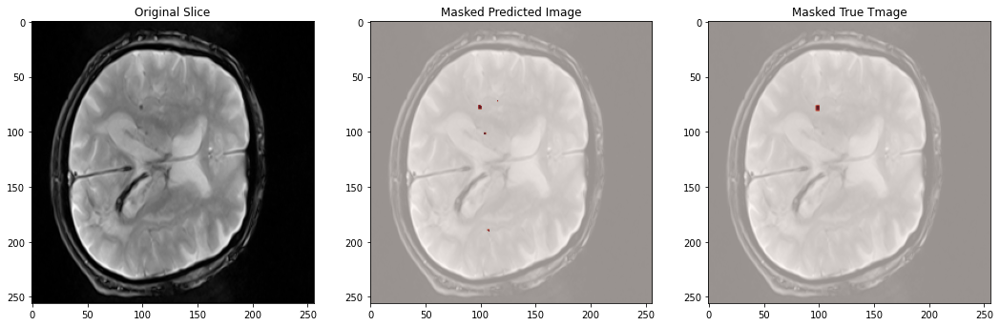

slice  53
dice loss:  0.31447744369506836
dice score:  0.6855225563049316


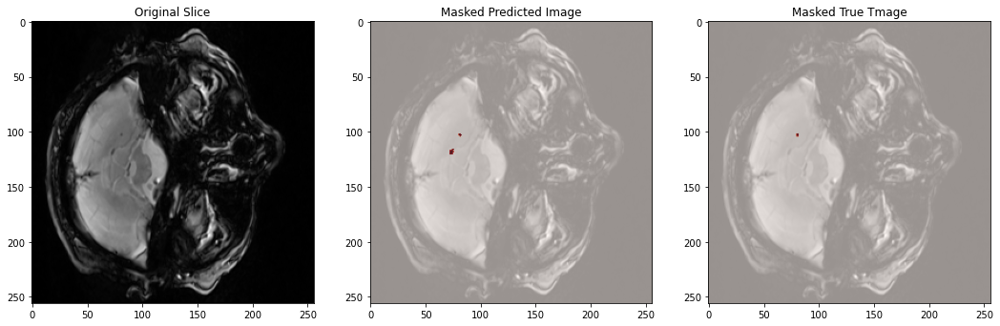

In [21]:
def plotscan(img, prediction, mask):
    plt.figure("Check", (3*6, 6))
    plt.axis('off')
    plt.grid(b = None)
    plt.subplot(1, 3, 1)
    plt.title(f"Original Slice")
    plt.imshow(img[0,0], cmap = plt.get_cmap('gray'))
    plt.subplot(1, 3, 2)
    plt.title("Masked Predicted Image")
    plt.imshow(img[0,0], cmap = plt.get_cmap('gray'))
    plt.imshow(prediction[0,1], cmap = 'Reds', alpha = 0.6)
    plt.subplot(1, 3, 3)
    plt.title("Masked True Tmage")
    plt.imshow(img[0,0], cmap = plt.get_cmap('gray'))
    plt.imshow(mask[0,0], cmap = 'Reds', alpha = 0.6)
    plt.show()

# fazer uma previsão utilizando um caso
def make_prediction_full(model_classification, model_segmentation, img_in, mask_in, loss_function):
    predictions_seg = []
    actual_values_seg = []
    dicelosstotal = 0
    dicescoretotal = 0
    for i, img in enumerate(img_in):
        print("slice ", i)
        #img = img_in[i]
        mask = mask_in[i]
        img = img.to(DEVICE)
        img = img[None, :]
        mask = mask[None, :]
        macro_detected = img_with_without_macro(img, model_classification) 
        if macro_detected == 1:
            prediction = model_segmentation(img).cpu().detach()
            prediction_binary = predict_segmentation(prediction, mutually_exclusive=True, threshold=0)
            #mask_numpy = mask.numpy()
            mask_numpy = np.float32(mask)
            prediction_binary_numpy = np.float32(prediction_binary)
            predictions_seg.append(prediction_binary_numpy)
            actual_values_seg.append(mask_numpy)
            dice = loss_function(prediction, mask)
            print("dice loss: ", dice.item())
            dicelosstotal = dicelosstotal + dice.item()
            dicescore = 1 - dice.item()
            print("dice score: ", dicescore)
            dicescoretotal = dicescoretotal + dicescore
            img = img.cpu() 
            #print(classification_report(mask, prediction_binary))
            #cr = classification_report(mask, prediction_binary, output_dict = True)
            plotscan(img, prediction, mask)
        else:
            print("macrohemorrhage not detected in this slice")
    return predictions_seg, actual_values_seg, dicelosstotal, dicescoretotal

def make_prediction( model, img_in, mask_in, loss_function):
    predictions_seg = []
    actual_values_seg = []
    dicelosstotal = 0
    dicescoretotal = 0
    for i, img in enumerate(img_in):
        print("slice ", i)
        mask = mask_in[i]
        img = img.to(DEVICE)
        img = img[None, :]
        mask = mask[None, :] 
        prediction = model(img).cpu().detach()
        
        prediction_binary = predict_segmentation(prediction, mutually_exclusive = True, threshold = 0)
        mask_numpy = np.float32(mask)
        prediction_binary_numpy = np.float32(prediction_binary)
        predictions_seg.append(prediction_binary_numpy)
        actual_values_seg.append(mask_numpy)
        dice = loss_function(prediction, mask)
        print("dice loss: ", dice.item())
        dicelosstotal = dicelosstotal + dice.item()
        dicescore = 1 - dice.item()
        print("dice score: ", dicescore)
        dicescoretotal = dicescoretotal + dicescore
        img = img.cpu() 
        prediction = np.where(prediction > 0.5, 1, 0)
        plotscan(img, prediction, mask)
    return predictions_seg, actual_values_seg, dicelosstotal, dicescoretotal

model, _, _ = load_ckp(get_best_checkpoint("segmentation"), model, optimizer)
check_data = next(iter(val_loader_all))
image, mask, label = (check_data["scan"], check_data["mask"], check_data["label"])
predictions_seg, actual_values_seg, dicelosstotal, dicescoretotal = make_prediction(model, image, mask, loss_function)